# October ??th, 2021

**Motivation**: ?? <br>

In [1]:
# HIDE CODE


import os
import sys
import nibabel as nib
import networkx as nx
from time import time
from pprint import pprint
from copy import deepcopy as dc
from os.path import join as pjoin
from myterial import orange, blue_grey
from IPython.display import display, IFrame, HTML
from matplotlib.colors import rgb2hex, to_rgb
import matplotlib.pyplot as plt
import seaborn as sns

# set style & no interpolalation
import matplotlib
matplotlib.rcParams['image.interpolation'] = 'none'
sns.set_style('whitegrid')
%matplotlib inline

# tmp & extras dir
git_dir = pjoin(os.environ['HOME'], 'Dropbox/git')
tmp_dir = pjoin(git_dir, 'jb-Ca-fMRI/tmp')
extras_dir = pjoin(git_dir, 'jb-Ca-fMRI/_extras')
lfr_dir = pjoin(os.environ['HOME'], 'Documents/workspaces/lfr/binary_overlapping')


# GitHub
sys.path.insert(0, pjoin(git_dir, '_Ca-fMRI'))
from register.atlas import make_tree_graph
from register.parcellation import Parcellation
from analysis.hierarchical import Hierarchical
from analysis.bootstrap import *
from analysis.svinet import *
from analysis.group import *
from analysis.lfr import *
from utils.render import *
from utils.plotting import *
from model.mouse import Mice
from model.configuration import Config

# warnings
import warnings
warnings.filterwarnings('ignore', category=DeprecationWarning)

In [2]:
%%time

mice = Mice((768, 4))

CPU times: user 214 ms, sys: 715 ms, total: 929 ms
Wall time: 976 ms


In [3]:
mice.setup_func_data('rest')

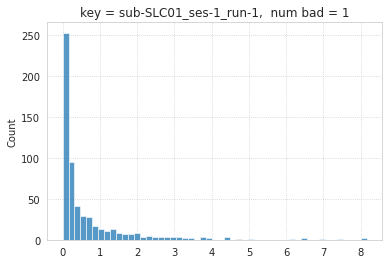

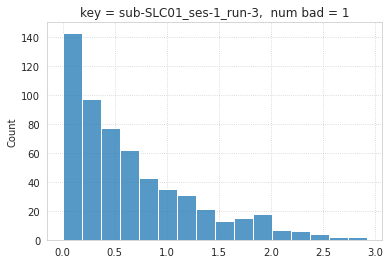

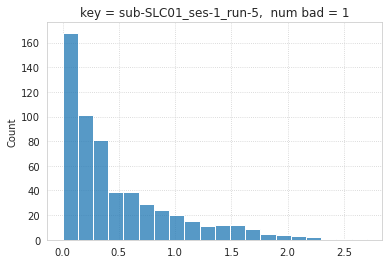

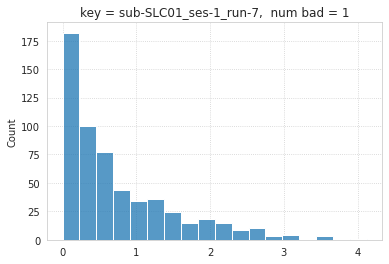

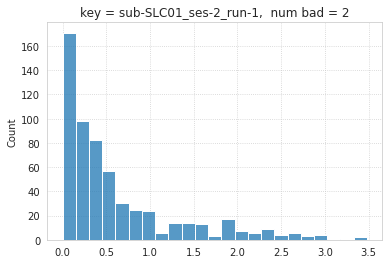

...

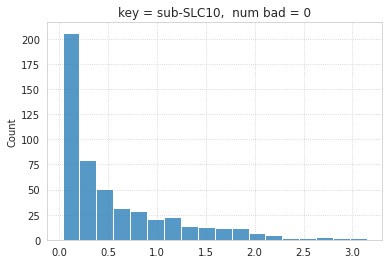

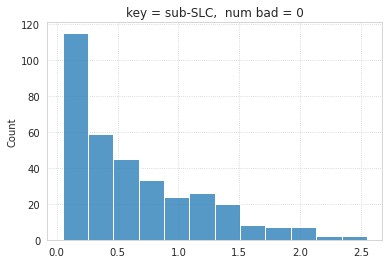

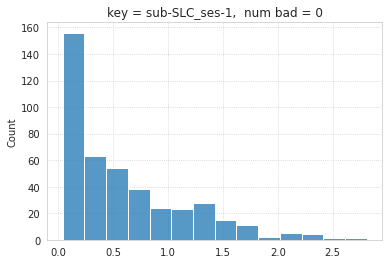

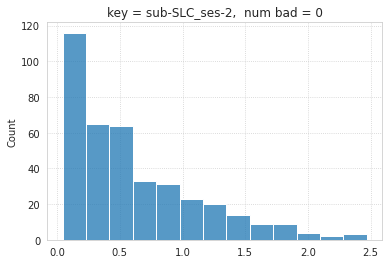

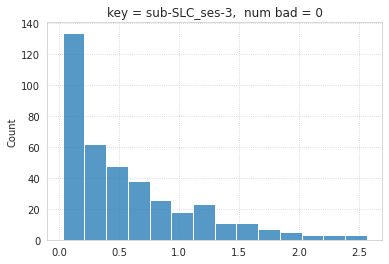

In [33]:
for key, func in mice.ca.items():
    xxx = np.var(func[:], axis=1)
    sns.histplot(xxx)
    plt.title(f"key = {key},  num bad = {(xxx < 1e-3).sum()}")
    plt.show()

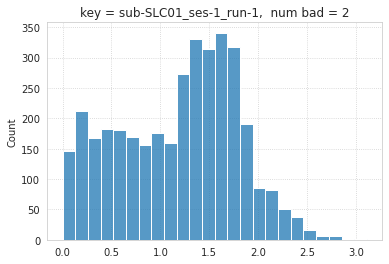

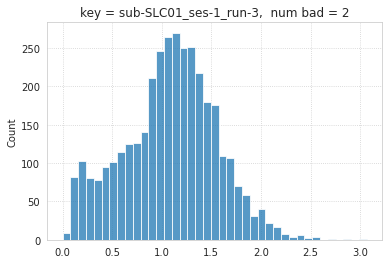

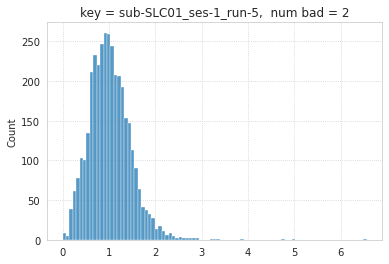

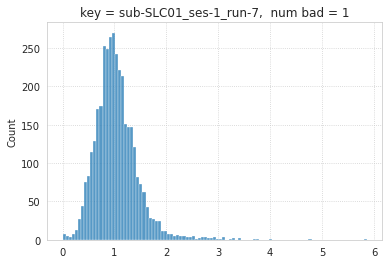

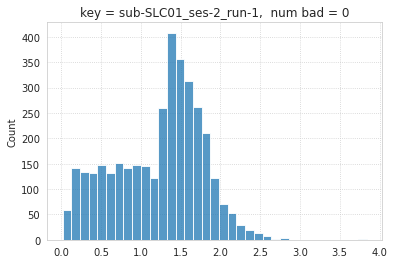

...

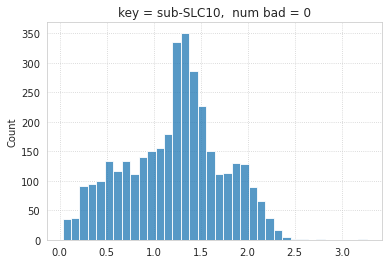

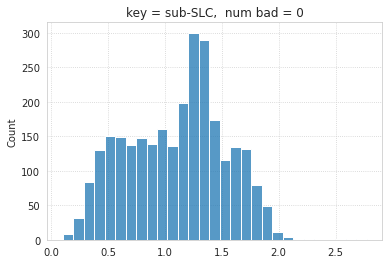

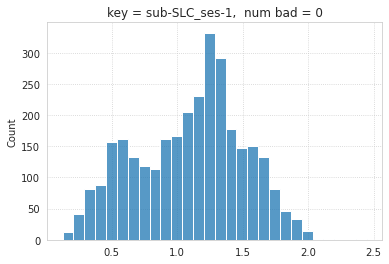

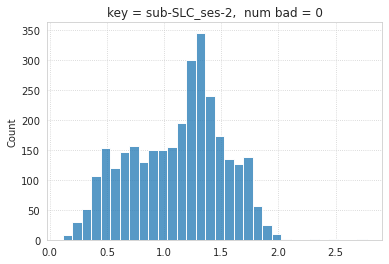

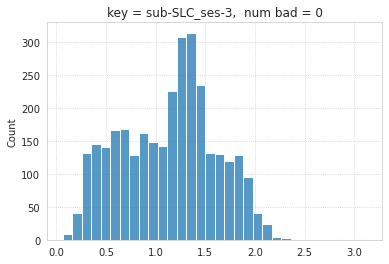

In [34]:
for key, func in mice.bold.items():
    xxx = np.var(func[:], axis=1)
    sns.histplot(xxx)
    plt.title(f"key = {key},  num bad = {(xxx < 1e-3).sum()}")
    plt.show()

In [3]:
mice.cat_data(nogsr=True, verbose=True)

[PROGRESS] 'sub-SLC01_ses-1_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC01_ses-2_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC01_ses-3_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC02_ses-1_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC02_ses-2_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC02_ses-3_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC03_ses-1_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC03_ses-2_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC03_ses-3_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC04_ses-1_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC04_ses-2_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC04_ses-3_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC05_ses-1_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC05_ses-2_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC05_ses-3_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC06_ses-1_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC06_ses-2_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC06_ses-3_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC07_ses-1_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC07_ses-2_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC07_ses-3_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC08_ses-1_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC08_ses-2_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC08_ses-3_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC09_ses-1_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC09_ses-2_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC09_ses-3_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC10_ses-1_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC10_ses-2_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC01_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC02_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC03_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC04_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC05_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC06_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC07_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC08_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC09_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC10_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC_ses-1_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC_ses-2_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC_ses-3_task-rest_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC01_ses-1_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC01_ses-2_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC01_ses-3_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC02_ses-1_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC02_ses-2_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC02_ses-3_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC03_ses-1_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC03_ses-2_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC03_ses-3_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC04_ses-1_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC04_ses-2_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC04_ses-3_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC05_ses-1_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC05_ses-2_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC05_ses-3_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC06_ses-1_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC06_ses-2_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC06_ses-3_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC07_ses-1_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC07_ses-2_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC07_ses-3_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC08_ses-1_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC08_ses-2_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC08_ses-3_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC09_ses-1_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC09_ses-2_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC09_ses-3_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC10_ses-1_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC10_ses-2_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC01_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC02_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC03_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC04_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC05_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC06_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC07_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC08_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC09_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC10_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC_ses-1_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC_ses-2_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC_ses-3_task-led_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

Warning, sub-SLC: 51 % of ROIs are nan. Moving on . . .

[PROGRESS] 'sub-SLC01_ses-1_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC01_ses-2_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC01_ses-3_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC02_ses-1_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC02_ses-2_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC02_ses-3_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC03_ses-1_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC03_ses-2_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC03_ses-3_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC04_ses-1_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC04_ses-2_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC04_ses-3_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC05_ses-1_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC05_ses-2_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC05_ses-3_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC06_ses-1_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC06_ses-2_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC06_ses-3_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC07_ses-1_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC07_ses-2_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC07_ses-3_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC08_ses-1_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC08_ses-2_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC08_ses-3_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC09_ses-1_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC09_ses-2_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC09_ses-3_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC10_ses-1_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC10_ses-2_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC01_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC02_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC03_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC04_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC05_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC06_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC07_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC08_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC09_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC10_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC_ses-1_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC_ses-2_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC_ses-3_task-all_space-CCF2d_desc-nogsr-cat_ca2.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/ca2

[PROGRESS] 'sub-SLC01_ses-1_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC01_ses-2_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC01_ses-3_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC02_ses-1_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC02_ses-2_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC02_ses-3_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC03_ses-1_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC03_ses-2_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC03_ses-3_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC04_ses-1_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC04_ses-2_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC04_ses-3_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC05_ses-1_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC05_ses-2_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC05_ses-3_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC06_ses-1_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC06_ses-2_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC06_ses-3_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC07_ses-1_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC07_ses-2_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC07_ses-3_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC08_ses-1_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC08_ses-2_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC08_ses-3_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC09_ses-1_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC09_ses-2_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC09_ses-3_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC10_ses-1_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC10_ses-2_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC01_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC02_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC03_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC04_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC05_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC06_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC07_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC08_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC09_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC10_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC_ses-1_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC_ses-2_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC_ses-3_task-rest_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC01_ses-1_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC01_ses-2_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC01_ses-3_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC02_ses-1_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC02_ses-2_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC02_ses-3_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC03_ses-1_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC03_ses-2_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC03_ses-3_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC04_ses-1_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC04_ses-2_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC04_ses-3_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC05_ses-1_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC05_ses-2_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC05_ses-3_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC06_ses-1_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC06_ses-2_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC06_ses-3_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC07_ses-1_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC07_ses-2_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC07_ses-3_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC08_ses-1_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC08_ses-2_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC08_ses-3_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC09_ses-1_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC09_ses-2_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC09_ses-3_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC10_ses-1_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC10_ses-2_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC01_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC02_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC03_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC04_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC05_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC06_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC07_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC08_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC09_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC10_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC_ses-1_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC_ses-2_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC_ses-3_task-led_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC01_ses-1_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC01_ses-2_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC01_ses-3_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC02_ses-1_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC02_ses-2_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC02_ses-3_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC03_ses-1_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC03_ses-2_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC03_ses-3_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC04_ses-1_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC04_ses-2_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC04_ses-3_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC05_ses-1_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC05_ses-2_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC05_ses-3_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC06_ses-1_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC06_ses-2_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC06_ses-3_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC07_ses-1_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC07_ses-2_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC07_ses-3_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC08_ses-1_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC08_ses-2_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC08_ses-3_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC09_ses-1_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC09_ses-2_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC09_ses-3_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC10_ses-1_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC10_ses-2_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC01_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC02_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC03_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC04_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC05_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC06_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC07_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC08_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC09_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC10_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC_ses-1_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC_ses-2_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'sub-SLC_ses-3_task-all_space-CCF3d_desc-nogsr-cat_bold.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4/bold

[PROGRESS] 'combine_meta.npy' saved at
/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-512*4

In [64]:
net = Network(mice, mode='ca2')

In [65]:
_ = net.fit_network()

[PROGRESS] fit: initiated

[PROGRESS] graphs: done

[PROGRESS] fit: done!

<matplotlib.colorbar.Colorbar object at 0x7f19868aabe0>

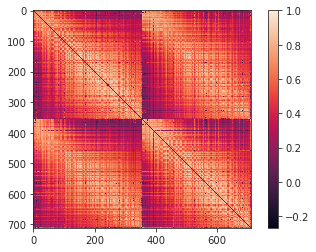

In [68]:
plt.imshow(net.adj)
plt.colorbar()

<matplotlib.colorbar.Colorbar object at 0x7f19248d4ee0>

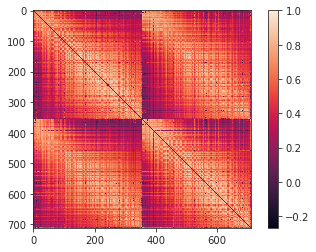

<AxesSubplot:ylabel='Count'>

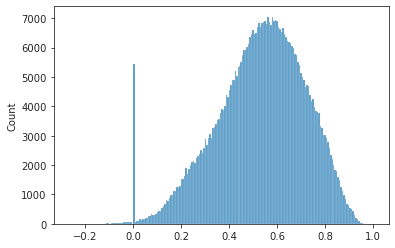

In [69]:
sns.histplot(net.adj.ravel())

<matplotlib.colorbar.Colorbar object at 0x7f16acab5ca0>

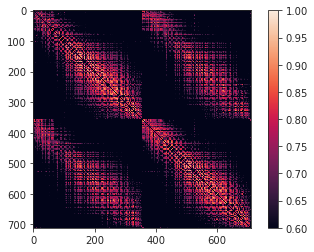

In [70]:
plt.imshow(net.adj, vmin=0.6)
plt.colorbar()

<matplotlib.colorbar.Colorbar object at 0x7f19869ee1f0>

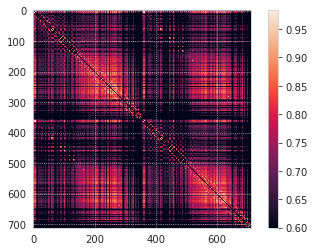

In [43]:
plt.imshow(net.adj, vmin=0.6)
plt.colorbar()

In [71]:
from nancorrmp.nancorrmp import NaNCorrMp
from analysis.hierarchical import get_clust_graph, sp_hier

In [72]:
adj_sym = (net.adj + net.adj.T) / 2

In [73]:
d = 1 - adj_sym
np.fill_diagonal(d, 0.)

In [74]:
z = sp_hier.linkage(
    sp_dist.squareform(d),
    method='ward',
    metric='correlation',
    optimal_ordering=True,
)

In [75]:
result = get_clust_graph(
    linkage_mat=z,
    labels=net.l2n,
    num_clusters=5,
)
comm_vec = np.zeros(len(net.n2l))
for c_idx, clist in result['cluster_assigns'].items():
    for lbl in clist:
        comm_vec[net.l2n[lbl]] = c_idx
proj = net.project_vec(comm_vec)

<matplotlib.image.AxesImage object at 0x7f16ad6148e0>

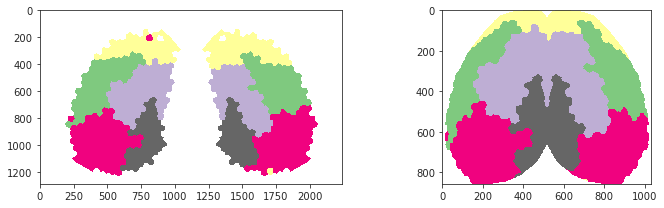

In [77]:
fig, axes = create_figure(1, 2, (12, 3))

tr = net.trim2d(proj)
x2plt = tr['proj-flat'].squeeze()
x2plt = np.ma.masked_where(x2plt < 0.01, x2plt)
axes[0].imshow(x2plt, cmap='Accent_r')
x2plt = tr['proj-top'].squeeze()
x2plt = np.ma.masked_where(x2plt < 0.01, x2plt)
axes[1].imshow(x2plt, cmap='Accent_r')

In [55]:
list(proj)

['parcel2d-top', 'parcel2d-flat', 'parcel3d']

In [3]:
mice._load_combine_meta()

combine metadata not found, time to run cat_data() . . .

In [ ]:
mice.cat_data()

Warning, sub-SLC: 51 % of ROIs are nan. Moving on . . .

In [7]:
key = 'sub-SLC03_ses-3_run-1'
_k = 'sub-SLC03_ses-3'

In [4]:
func = mice.bold_preproc[key]

In [5]:
x = func[:]
x.shape

(64, 62, 78, 600)

In [8]:
m = mice.T1w[_k]

In [9]:
m_indiv = m.load_ants()

In [10]:
m_indiv

ANTsImage (RAI)
         Pixel Type : float (float32)
         Components : 1
         Dimensions : (64, 64, 78)
         Spacing    : (0.2, 0.2, 0.2)
         Origin     : (6.4, -6.2, -7.8)
         Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]

In [12]:
for _k, anat in mice.T1w.items():
    indiv = anat.load_ants()
    mask = mice.mask3d[_k].load_ants()
    print(_k, indiv.shape, mask.shape, indiv.shape == mask.shape)

sub-SLC01_ses-1
(64, 64, 78)
(64, 64, 78)
True

sub-SLC01_ses-2
(64, 64, 78)
(64, 64, 78)
True

sub-SLC01_ses-3
(64, 64, 78)
(64, 64, 78)
True

sub-SLC02_ses-1
(64, 64, 78)
(64, 64, 78)
True

sub-SLC02_ses-2
(64, 64, 78)
(64, 64, 78)
True

sub-SLC02_ses-3
(64, 64, 78)
(64, 64, 78)
True

sub-SLC03_ses-1
(64, 64, 78)
(64, 64, 78)
True

sub-SLC03_ses-2
(64, 64, 78)
(64, 64, 78)
True

sub-SLC03_ses-3
(64, 64, 78)
(64, 64, 78)
True

sub-SLC04_ses-1
(64, 64, 78)
(64, 64, 78)
True

sub-SLC04_ses-2
(64, 64, 78)
(64, 64, 78)
True

sub-SLC04_ses-3
(64, 62, 78)
(64, 62, 78)
True

sub-SLC05_ses-1
(64, 64, 78)
(64, 64, 78)
True

sub-SLC05_ses-2
(64, 64, 78)
(64, 64, 78)
True

sub-SLC05_ses-3
(64, 64, 78)
(64, 64, 78)
True

sub-SLC06_ses-1
(64, 64, 78)
(64, 64, 78)
True

sub-SLC06_ses-2
(64, 64, 78)
(64, 64, 78)
True

sub-SLC06_ses-3
(64, 64, 78)
(64, 64, 78)
True

sub-SLC07_ses-1
(64, 64, 78)
(64, 64, 78)
True

sub-SLC07_ses-2
(64, 64, 78)
(64, 64, 78)
True

sub-SLC07_ses-3
(64, 64, 78)
(64, 64, 78)
True

sub-SLC08_ses-1
(64, 64, 78)
(64, 64, 78)
True

sub-SLC08_ses-2
(64, 64, 78)
(64, 64, 78)
True

sub-SLC08_ses-3
(64, 64, 78)
(64, 64, 78)
True

sub-SLC09_ses-1
(64, 64, 78)
(64, 64, 78)
True

sub-SLC09_ses-2
(64, 64, 78)
(64, 64, 78)
True

sub-SLC09_ses-3
(64, 64, 78)
(64, 64, 78)
True

sub-SLC10_ses-1
(64, 64, 78)
(64, 64, 78)
True

sub-SLC10_ses-2
(64, 64, 78)
(64, 64, 78)
True

In [3]:
from register.register import Register

In [4]:
reg = Register(mice)

In [5]:
acc = reg.get_accepted_regions(0.1)

Name: cortex . . . a total of: 3470 regions accepted, 8 regions rejected.
accept ratio: 99.77 %, reject ratio: 0.23 %, using a presence threshold of 10.0 %

Name: subcortex-l . . . a total of: 154 regions accepted, 0 regions rejected.
accept ratio: 100.00 %, reject ratio: 0.00 %, using a presence threshold of 10.0 %

Name: subcortex-r . . . a total of: 154 regions accepted, 0 regions rejected.
accept ratio: 100.00 %, reject ratio: 0.00 %, using a presence threshold of 10.0 %

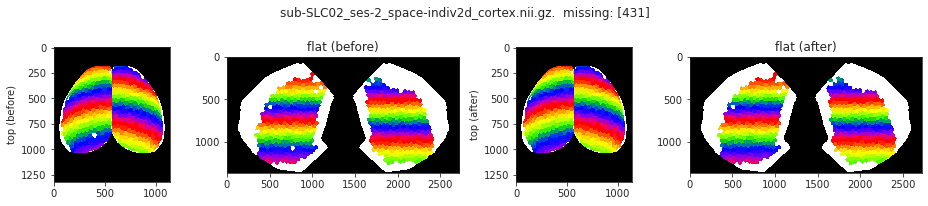

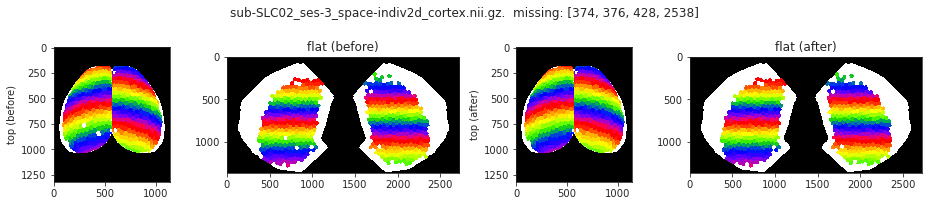

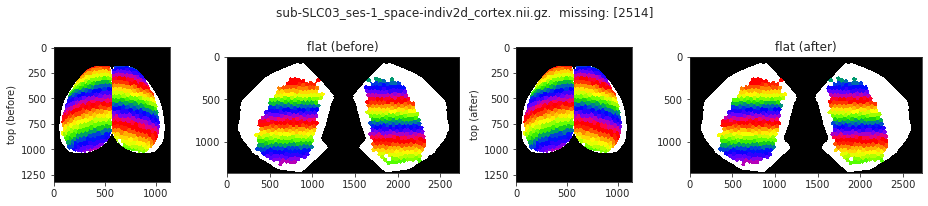

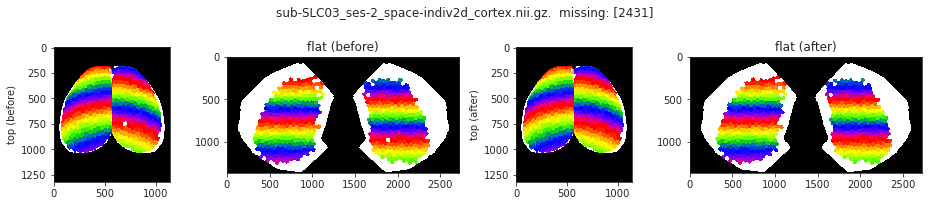

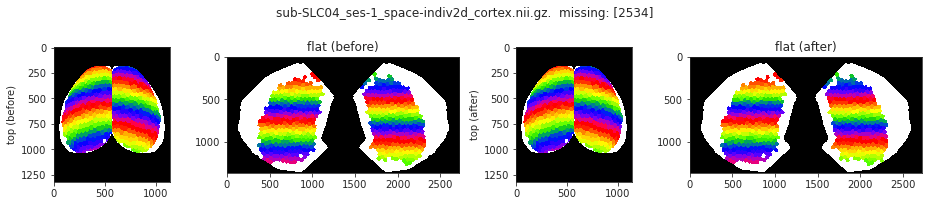

...

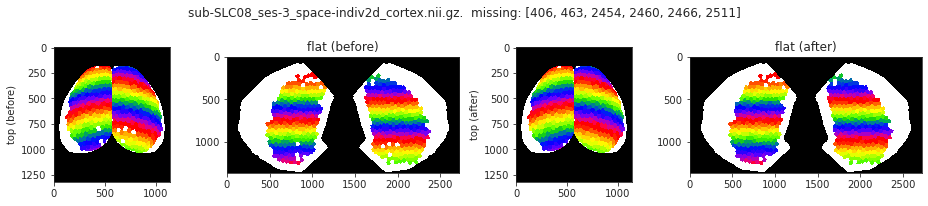

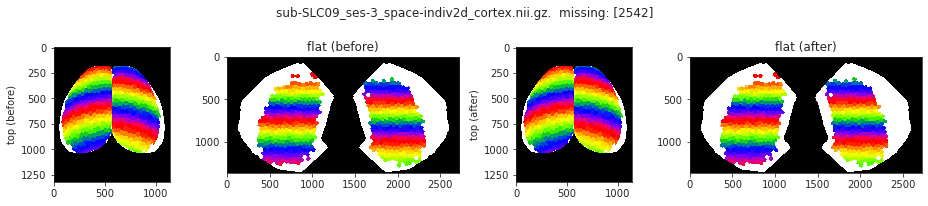

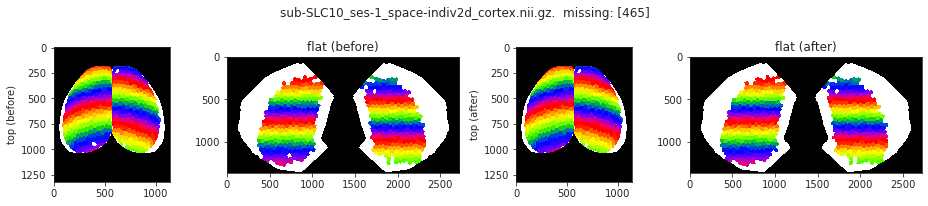

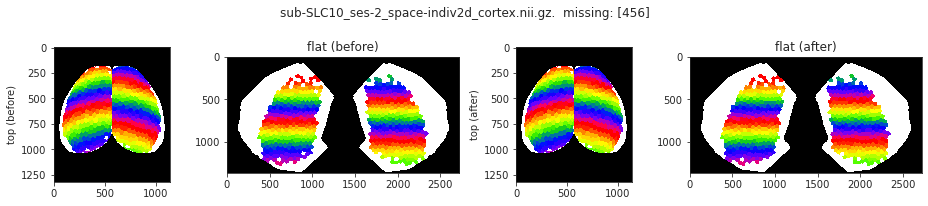

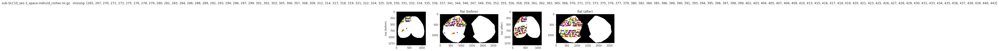

In [3]:
mice.setup_anat_data()

In [8]:
list(mice.mask2d)

[
    'sub-SLC01_ses-1',
    'sub-SLC01_ses-2',
    'sub-SLC01_ses-3',
    'sub-SLC02_ses-1',
    'sub-SLC02_ses-2',
    'sub-SLC02_ses-3',
    'sub-SLC03_ses-1',
    'sub-SLC03_ses-2',
    'sub-SLC03_ses-3',
    'sub-SLC04_ses-1',
    'sub-SLC04_ses-2',
    'sub-SLC04_ses-3',
    'sub-SLC05_ses-1',
    'sub-SLC05_ses-2',
    'sub-SLC05_ses-3',
    'sub-SLC06_ses-1',
    'sub-SLC06_ses-2',
    'sub-SLC06_ses-3',
    'sub-SLC07_ses-1',
    'sub-SLC07_ses-2',
    'sub-SLC07_ses-3',
    'sub-SLC08_ses-1',
    'sub-SLC08_ses-2',
    'sub-SLC08_ses-3',
    'sub-SLC09_ses-1',
    'sub-SLC09_ses-2',
    'sub-SLC09_ses-3',
    'sub-SLC10_ses-1',
    'sub-SLC10_ses-2'
]

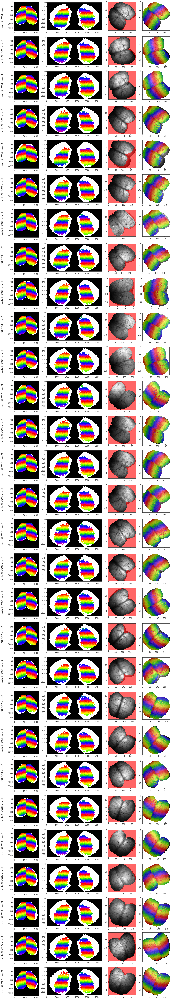

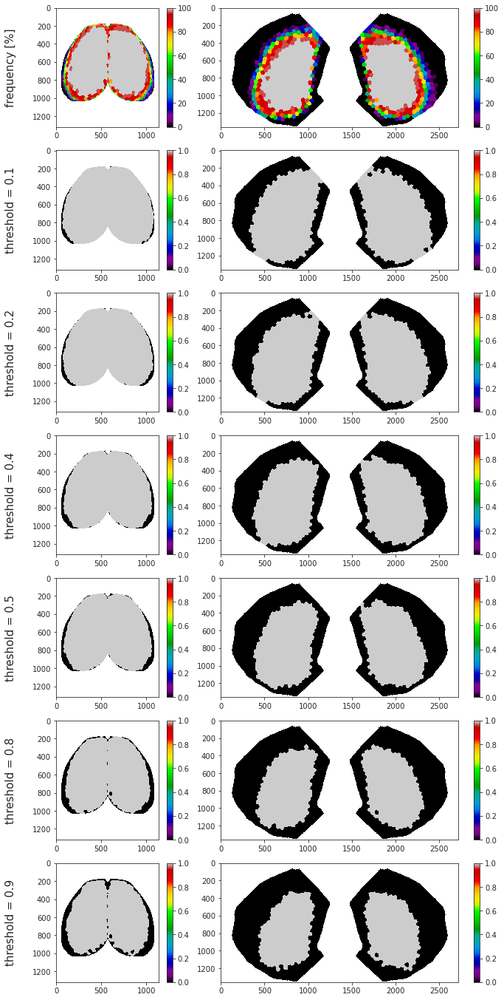

accept ratio: 75 %, reject ratio: 25 %, using a presence threshold of 10.0 %
a total of 712 regions were accepted

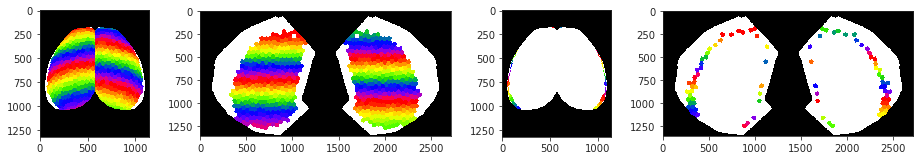

In [9]:
_ = mice.parcel.show_accepted_regions_2d(mice, thres=0.1)

In [2]:
from scipy.ndimage import gaussian_filter

def show_h(proj_h, proj_hr, cmap='icefire', interp='antialiased'):
    fig, axes = create_figure(1, 4, (13., 3), gridspec_kw={'width_ratios': [1.8, 1, 1, 1.8]})

    x2plt = proj_h['parcel2d-flat'].squeeze()
    x2plt = gaussian_filter(x2plt, sigma=1)
    x2plt = np.ma.masked_where(x2plt < 0.01, x2plt)
    im = axes[0].imshow(x2plt, cmap=cmap, interpolation=interp)
    plt.colorbar(im, ax=axes[0], shrink=0.4)

    x2plt = proj_h['parcel2d-top'].squeeze()
    x2plt = gaussian_filter(x2plt, sigma=1)
    x2plt = np.ma.masked_where(x2plt < 0.01, x2plt)
    axes[1].imshow(x2plt, cmap=cmap, interpolation=interp)

    x2plt = proj_hr['parcel2d-top'].squeeze()
    x2plt = gaussian_filter(x2plt, sigma=1)
    x2plt = np.ma.masked_where(x2plt < 0.01, x2plt)
    axes[2].imshow(x2plt, cmap=cmap, interpolation=interp)

    x2plt = proj_hr['parcel2d-flat'].squeeze()
    x2plt = gaussian_filter(x2plt, sigma=1)
    x2plt = np.ma.masked_where(x2plt < 0.01, x2plt)
    im = axes[3].imshow(x2plt, cmap=cmap, interpolation=interp)
    plt.colorbar(im, ax=axes[3], shrink=0.4)

    remove_ticks(axes)
    plt.show()
    
    
def get_h(pi_arr, approach='pi_animals'):
    if approach == 'pi_animals':
        pi = bn.nanmean(pi_arr, -3)
        pi = bn.nanmean(bn.nanmean(pi, 2), 1)
        h = sp_stats.entropy(pi, axis=-2) / np.log(pi.shape[-2])
        h = bn.nanmean(h, 0)
        hr = sp_stats.rankdata(h)
    elif approach == 'avg_pi_first':
        pi = bn.nanmean(pi_arr, -3)
        pi = bn.nanmean(bn.nanmean(bn.nanmean(pi, 2), 1), 0)
        h = sp_stats.entropy(pi, axis=0) / np.log(len(pi))
        hr = sp_stats.rankdata(h)
    elif approach == 'no_pi_avg':
        h_arr = sp_stats.entropy(pi_arr, axis=-2) / np.log(pi_arr.shape[-2])
        h = bn.nanmean(h_arr, -3)
        h = bn.nanmean(bn.nanmean(bn.nanmean(h, 2), 1), 0)
    hr = sp_stats.rankdata(h)
    proj_h = gr.project_vec(h)
    proj_hr = gr.project_vec(hr)
    return h, hr, proj_h, proj_hr

In [3]:
%%time

mice = Mice((768, 4))

CPU times: user 240 ms, sys: 767 ms, total: 1.01 s
Wall time: 1 s


In [4]:
mice.setup_func_data()

In [5]:
props = {
    'mice': mice,
    'num_k': 4,
    'perc': 'p20-binary',
    'metric': 'spearman',
    'match_metric': 'euclidean',
    'match_using': 'gam',
    'prepare_data': False,
    'verbose': False,
    'task': 'rest',
}

### Ca2

In [6]:
gr = Group(mode='ca2', centroids_from='all', **props)
group = gr.fit_group(skip_align=False)

Warning, nan in global order

In [7]:
# run
pi = bn.nanmean(group['pi_run'], -3)
pi_ca = bn.nanmean(pi.reshape(-1, *pi.shape[-2:]), 0)

disjoint = gr.get_disjoint_community(pi_ca, to_vec=True)
pi_ca = np.concatenate([pi_ca, np.expand_dims(disjoint, 0)])

proj_ca = gr.project_vec(pi_ca)

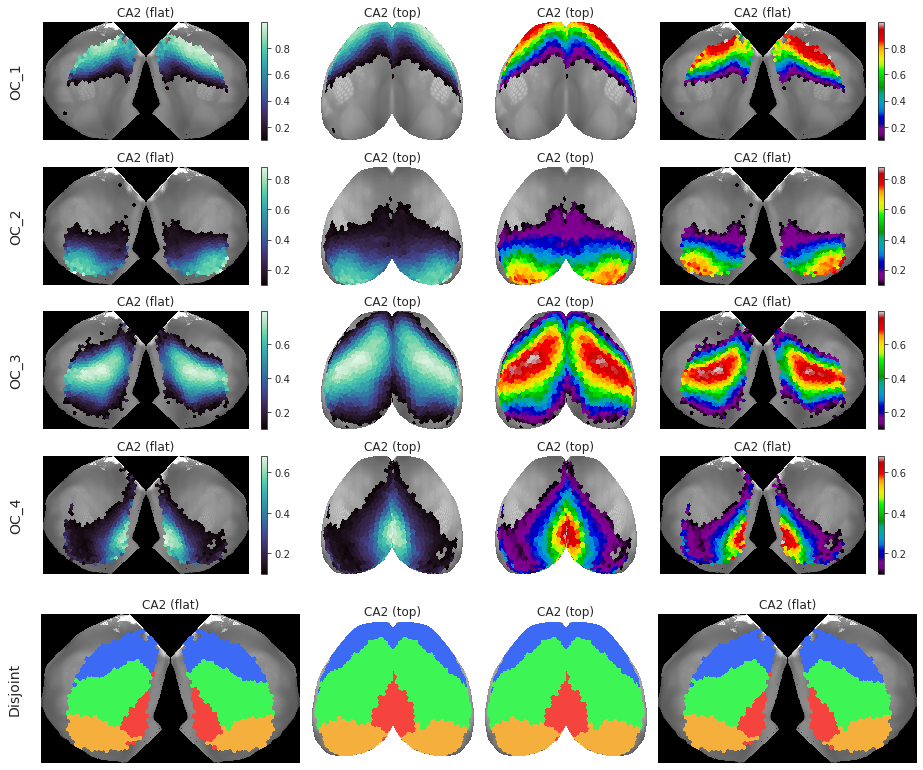

In [8]:
_ = gr.show(
    proj_ca,
    labels=('CA2',) * 2,
    cmaps=('mako', 'nipy_spectral'),
    display=True,
)

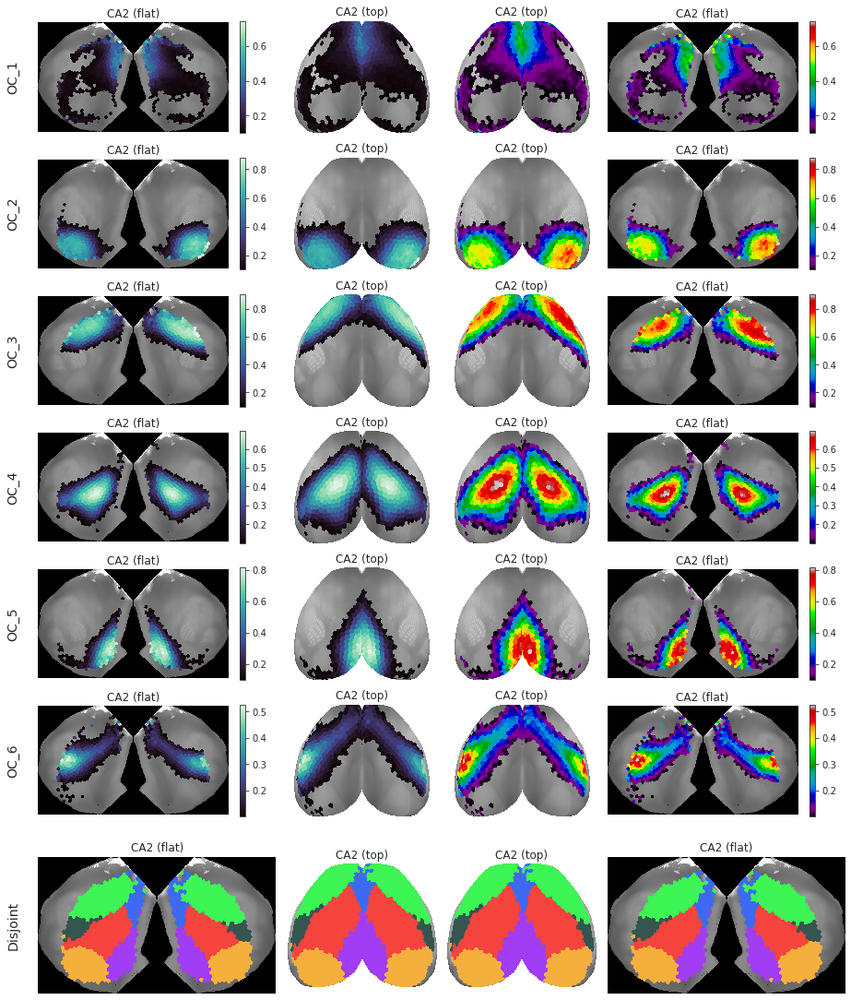

In [11]:
sv = SVINET(**props, mode='ca2')
print(f"Ca2 symmetry score\nacross runs :\t\t{sv.pi_symmetry_score(pi_ca, 3)}")


Ca2 symmetry score
across runs :           {1: 0.987, 2: 0.989, 3: 0.989, 4: 0.979, -1: 0.986}

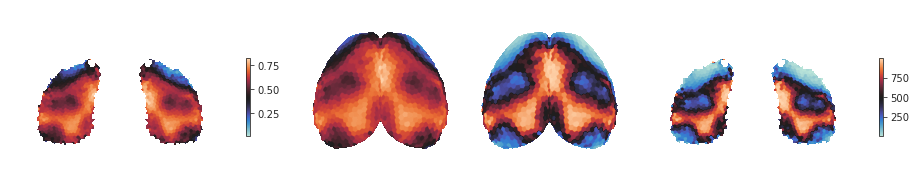

In [12]:
h, hr, proj_h, proj_hr = get_h(group['pi_run'], 'pi_animals')
_ = show_h(proj_h, proj_hr)

In [11]:
boot = bootstrap_scipy(
    data=group['gam_ses'],
    save_dir=tmp_dir,
    num_cuts=gr.n_cuts,
    bin_edges=gr.bin_edges,
    n_resamples=50,
    batch=5,
)

[PROGRESS] 'BCa:5.0e+01_bins(0.2,1.0;4).npy' saved at
/home/hadi/Dropbox/git/jb-Ca-fMRI/tmp

In [12]:
statistic = get_statistic_fn(
    axis_sub=0,
    axis_ses=1,
    axis_seed=2,
    est_sub=lambda x: x,
    est_ses=bn.nanmean,
    est_seed=bn.nanmedian,
    bins=gr.bins,
)
real_sample = statistic(group['gam_ses'])
real_sample.shape

(10, 6, 4)

In [13]:
dlist = []
for i in range(gr.num_k):
    for j, intvl in enumerate(gr.intervals):
        dlist.append({
            'interval': [intvl] * len(real_sample),
            'oc_idx': [i + 1] * len(real_sample),
            'color': [gr.colors[i + 1]] * len(real_sample),
            'subject': range(len(real_sample)),
            'mean': real_sample[:, i, j],
            'se': [boot['oc']['se'][i, j]] * len(real_sample),
        })
df_ca = pd.DataFrame(merge_dicts(dlist))

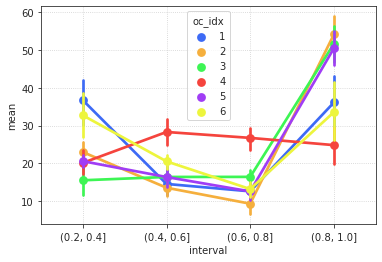

In [14]:
sns.pointplot(
    data=df_ca,
    x='interval',
    y='mean',
    hue='oc_idx',
    palette=gr.colors,
)
plt.grid()

In [16]:
func = mice.bold['sub-SLC08_ses-1_run-1']

In [24]:
mice.setup_preproc_data()

In [25]:
func = mice.bold_preproc['sub-SLC08_ses-1_run-1']

In [27]:
func[:].shape

(64, 64, 78, 600)

In [30]:
(np.isnan(func[:])).sum()

191692800

In [31]:
np.prod(func[:].shape)

191692800

In [22]:
np.where(np.isnan(func[:]).sum(0) > 0)[0]

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181,
       182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194,
       195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207,
       208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220,
       221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233,
       234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246,
       247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259,
       260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272,
       273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285,
       286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298,
       299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311,
       312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324,
       325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337,
       338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350,
       351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363,
       364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376,
       377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389,
       390, 391, 392, 393, 394, 395, 396, 397, 398, 399, 400, 401, 402,
       403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415,
       416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428,
       429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 440, 441,
       442, 443, 444, 445, 446, 447, 448, 449, 450, 451, 452, 453, 454,
       455, 456, 457, 458, 459, 460, 461, 462, 463, 464, 465, 466, 467,
       468, 469, 470, 471, 472, 473, 474, 475, 476, 477, 478, 479, 480,
       481, 482, 483, 484, 485, 486, 487, 488, 489, 490, 491, 492, 493,
       494, 495, 496, 497, 498, 499, 500, 501, 502, 503, 504, 505, 506,
       507, 508, 509, 510, 511, 512, 513, 514, 515, 516, 517, 518, 519,
       520, 521, 522, 523, 524, 525, 526, 527, 528, 529, 530, 531, 532,
       533, 534, 535, 536, 537, 538, 539, 540, 541, 542, 543, 544, 545,
       546, 547, 548, 549])

### BOLD-Lite

In [13]:
gr = Group(mode='bold-lite', centroids_from='all', **props)
group = gr.fit_group(skip_align=False)

ValueError: need at least one array to concatenate

In [ ]:
# run
# gam = bn.nanmedian(group['gam_run'], -3)
# pi = gam / np.nansum(gam, -2, keepdims=True)
pi = bn.nanmean(group['pi_run'], -3)
pi_bold_run = bn.nanmean(pi.reshape(-1, *pi.shape[-2:]), 0)

disjoint = gr.get_disjoint_community(pi_bold_run, to_vec=True)
pi_bold_run = np.concatenate([pi_bold_run, np.expand_dims(disjoint, 0)])

proj_bold_run = gr.project_vec(pi_bold_run)

# ses
# gam = bn.nanmedian(group['gam_ses'], -3)
# pi = gam / np.nansum(gam, -2, keepdims=True)
pi = bn.nanmean(group['pi_ses'], -3)
pi_bold_ses = bn.nanmean(pi.reshape(-1, *pi.shape[-2:]), 0)

disjoint = gr.get_disjoint_community(pi_bold_ses, to_vec=True)
pi_bold_ses = np.concatenate([pi_bold_ses, np.expand_dims(disjoint, 0)])

proj_bold_ses = gr.project_vec(pi_bold_ses)

In [ ]:
_ = gr.show(
    proj_1=proj_bold_run, proj_2=proj_bold_ses,
    labels=('BOLD, run', 'BOLD, ses'),
    cmaps=('rocket',) * 2,
    display=True,
)

In [ ]:
sv = SVINET(**props, mode='bold-lite')
print(f"BOLD symmetry score\nacross runs :\t\t{sv.pi_symmetry_score(pi_bold_run, 3)}\nacross sessions :\t{sv.pi_symmetry_score(pi_bold_ses, 3)}")

In [19]:
boot = bootstrap_scipy(
    data=group['gam_ses'],
    save_dir=tmp_dir,
    num_cuts=gr.n_cuts,
    bin_edges=gr.bin_edges,
    n_resamples=60,
    batch=5,
)

[PROGRESS] 'BCa:6.0e+01_bins(0.2,1.0;4).npy' saved at
/home/hadi/Dropbox/git/jb-Ca-fMRI/tmp

In [20]:
statistic = get_statistic_fn(
    axis_sub=0,
    axis_ses=1,
    axis_seed=2,
    est_sub=lambda x: x,
    est_ses=bn.nanmean,
    est_seed=bn.nanmedian,
    bins=gr.bins,
)
real_sample = statistic(group['gam_ses'])
real_sample.shape

(10, 6, 4)

In [21]:
dlist = []
for i in range(gr.num_k):
    for j, intvl in enumerate(gr.intervals):
        dlist.append({
            'interval': [intvl] * len(real_sample),
            'oc_idx': [i + 1] * len(real_sample),
            'color': [gr.colors[i + 1]] * len(real_sample),
            'subject': range(len(real_sample)),
            'mean': real_sample[:, i, j],
            'se': [boot['oc']['se'][i, j]] * len(real_sample),
        })
df_bold = pd.DataFrame(merge_dicts(dlist))

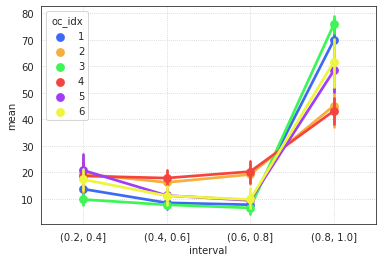

In [22]:
sns.pointplot(
    data=df_bold,
    x='interval',
    y='mean',
    hue='oc_idx',
    palette=gr.colors,
)
plt.grid()

In [23]:
boot['oc']

{
    'se': array([[2.52569949, 1.42262853, 1.10690731, 4.35403678],
       [3.38535117, 1.89961714, 1.7527882 , 4.19676757],
       [0.94055317, 0.75816566, 1.56989669, 1.93615191],
       [2.62161333, 1.46871991, 2.15260203, 2.58140242],
       [2.78102745, 1.15220932, 1.0647096 , 4.26709352],
       [2.15602056, 1.88262947, 1.78024514, 4.85619425]]),
    'ci_low': array([[ 9.33108647,  5.18641778,  5.37129141, 61.60263885],
       [13.48456867, 12.17305409, 16.11280456, 33.68728714],
       [ 7.60111203,  5.93624958,  3.8372342 , 72.2937611 ],
       [12.81947141, 15.13293389, 16.22615161, 37.70712076],
       [14.50557501,  7.91674718,  7.67071221, 50.1730809 ],
       [13.10148663,  7.53096216,  6.01864996, 51.06551679]]),
    'ci_high': array([[18.88118773, 11.36842777, 10.01148131, 82.20067556],
       [28.6664544 , 19.95324577, 24.24227511, 53.30024426],
       [11.77455958,  9.4046232 ,  9.85820032, 79.6047547 ],
       [24.45259597, 21.24184497, 25.50650101, 48.90305499],
       [26.56052711, 13.15516595, 11.81614025, 70.45268358],
       [20.92229773, 15.29261341, 13.90087428, 71.20719878]])
}

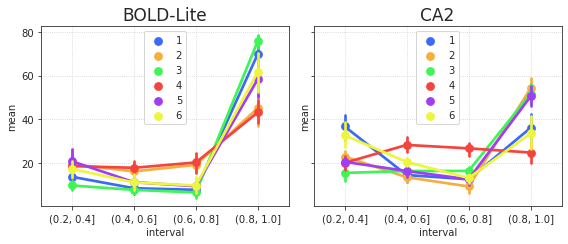

In [24]:
fig, axes = create_figure(1, 2, (8, 3.5), 'all', 'all')

sns.pointplot(
    data=df_bold,
    x='interval',
    y='mean',
    hue='oc_idx',
    palette=gr.colors,
    ax=axes[0],
)
axes[0].set_title('BOLD-Lite', fontsize=17)

sns.pointplot(
    data=df_ca,
    x='interval',
    y='mean',
    hue='oc_idx',
    palette=gr.colors,
    ax=axes[1],
)
axes[1].set_title('CA2', fontsize=17)

for ax in axes.flat:
    ax.legend(loc='upper center')
    ax.grid()
fig.savefig(pjoin(tmp_dir, 'distributions.pdf'), bbox_inches='tight')
plt.show()

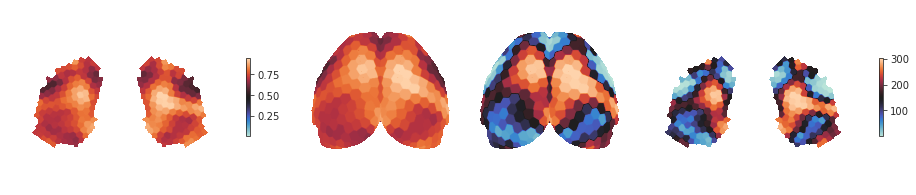

In [25]:
h, hr, proj_h, proj_hr = get_h(group['pi_run'], 'pi_animals')
_ = show_h(proj_h, proj_hr)

In [26]:
fig, _ = gr.show(
    proj_bold_run, proj_ca_run,
    labels=('BOLD-Lite', 'CA2'),
    cmaps=('rocket', 'mako'),
    display=False,
)
sup = f"k{props.get('num_k')} / {props.get('perc')}"
sup = fig.suptitle(sup, fontsize=20, y=1.02)

In [27]:
fig.savefig(
    pjoin(tmp_dir, 'communities_svinet.pdf'),
    bbox_extra_artists=[sup],
    bbox_inches='tight',
)
fig.savefig(
    pjoin(tmp_dir, 'communities_svinet.png'),
    bbox_extra_artists=[sup],
    bbox_inches='tight', 
    dpi=200,
)

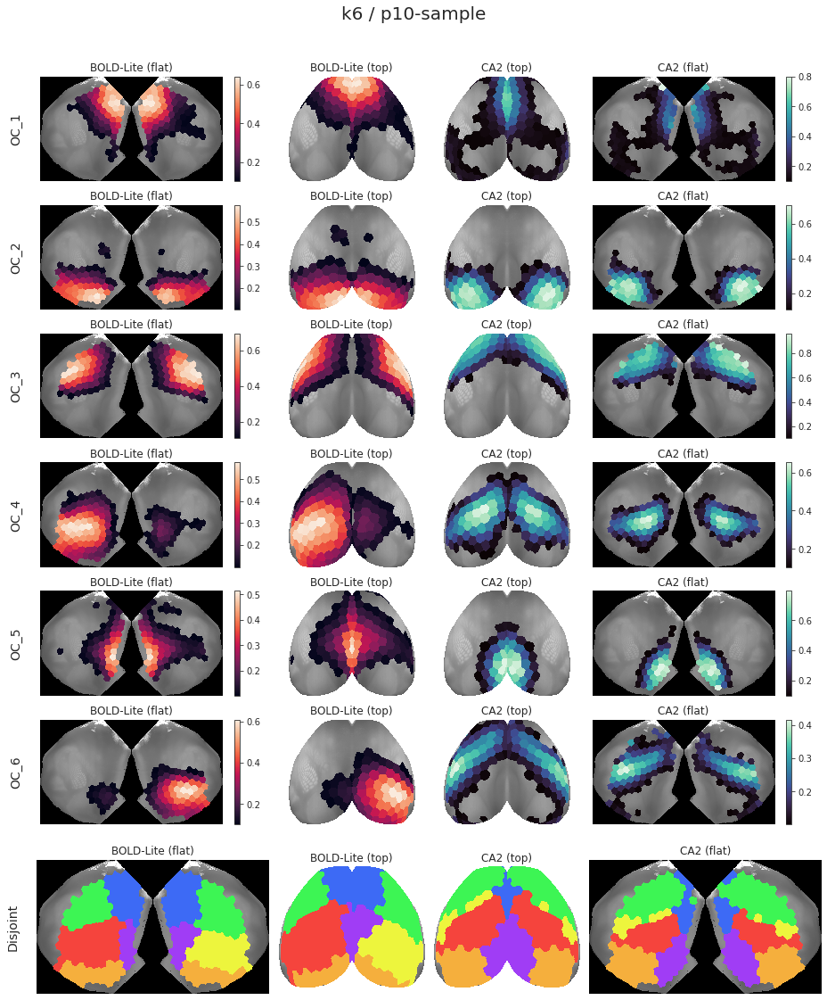

In [28]:
fig

In [9]:
sv = SVINET(**props, mode='ca2')
sv.pi_symmetry_score(pi_ca, 3)

{1: 0.988, 2: 0.984, 3: 0.99, 4: 0.984, 5: 0.978, -1: 0.985}

In [76]:
gr = Group(mode='ca2', centroids_from='runs', **props)
pi_arr, gam_arr, lam_arr = gr.fit_group(skip_align=False)

Warning, nan in global order

In [77]:
pi = bn.nanmean(pi_arr, -3)
pi_ca = bn.nanmean(pi.reshape(-1, *pi.shape[-2:]), 0)

disjoint = gr.get_disjoint_community(pi_ca, to_vec=True)
pi_ca = np.concatenate([pi_ca, np.expand_dims(disjoint, 0)])

pi_ca.shape

(6, 302)

In [78]:
proj_ca = gr.project_vec(pi_ca)

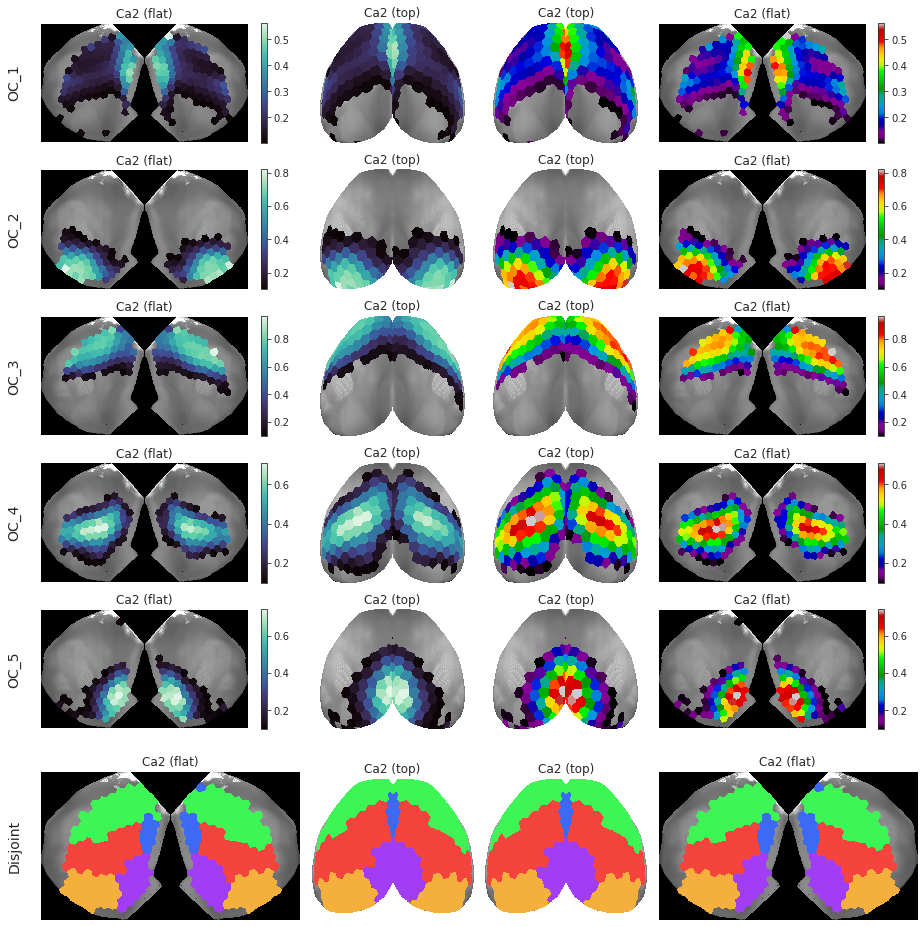

In [79]:
gr.show(proj_ca, labels=('Ca2',) * 2, cmaps=('mako', 'nipy_spectral'))

In [80]:
sv = SVINET(**props, mode='ca2')
sv.pi_symmetry_score(pi_ca, 3)

{1: 0.984, 2: 0.986, 3: 0.992, 4: 0.991, 5: 0.985, -1: 0.987}

<AxesSubplot:ylabel='Count'>

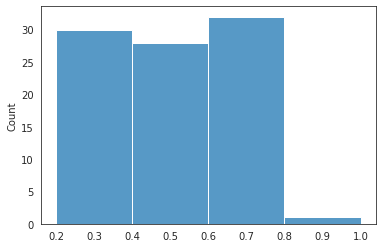

In [81]:
sns.histplot(pi_ca[4], bins=np.linspace(0.2, 1.0, 5))

In [82]:
pi = bn.nanmean(pi_arr, -3)
pi_ca = bn.nanmean(pi.reshape(-1, *pi.shape[-2:]), 0)
pi_ca.shape

(5, 302)

In [83]:
h = sp_stats.entropy(pi_ca, axis=0) / np.log(len(pi_ca))

In [84]:
proj_h = gr.project_vec(h)

<matplotlib.colorbar.Colorbar object at 0x7f110e1cf9a0>

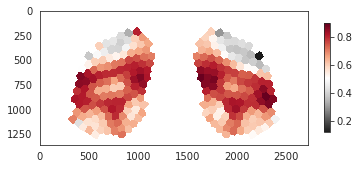

In [85]:
x2plt = proj_h['parcel2d-flat'].squeeze()
x2plt = np.ma.masked_where(x2plt < 0.01, x2plt)
plt.imshow(x2plt, cmap='RdGy_r')
plt.colorbar(shrink=0.5)

<matplotlib.colorbar.Colorbar object at 0x7f1197f43eb0>

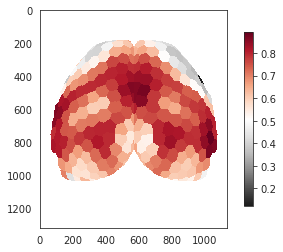

In [86]:
x2plt = proj_h['parcel2d-top'].squeeze()
x2plt = np.ma.masked_where(x2plt < 0.01, x2plt)
plt.imshow(x2plt, cmap='RdGy_r')
plt.colorbar(shrink=0.8)

In [87]:
pi_arr.shape

(10, 3, 4, 1000, 5, 302)

In [88]:
h_arr = sp_stats.entropy(pi_arr, axis=-2) / np.log(pi_arr.shape[-2])

In [89]:
h = np.nanmean(np.nanmean(np.nanmean(np.nanmean(h_arr, -2), 2), 1), 0)
h.shape, h_arr.shape

((302,), (10, 3, 4, 1000, 302))

In [90]:
proj_h = gr.project_vec(h)

<matplotlib.colorbar.Colorbar object at 0x7f11af244430>

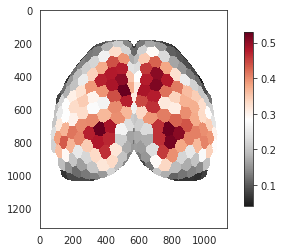

In [91]:
x2plt = proj_h['parcel2d-top'].squeeze()
x2plt = np.ma.masked_where(x2plt < 0.01, x2plt)
plt.imshow(x2plt, cmap='RdGy_r')
plt.colorbar(shrink=0.8)

<matplotlib.colorbar.Colorbar object at 0x7f10fcaaf910>

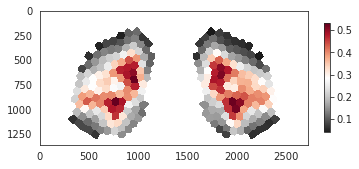

In [92]:
x2plt = proj_h['parcel2d-flat'].squeeze()
x2plt = np.ma.masked_where(x2plt < 0.01, x2plt)
plt.imshow(x2plt, cmap='RdGy_r')
plt.colorbar(shrink=0.5)

<AxesSubplot:ylabel='Count'>

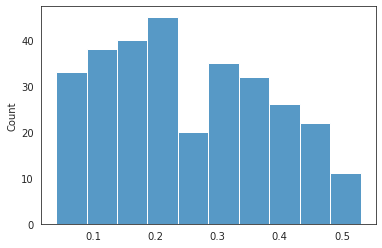

In [93]:
sns.histplot(h)

In [94]:
np.quantile(h, [0.25, 0.5, 0.75])

array([0.14422146, 0.23137912, 0.35681387])

<matplotlib.colorbar.Colorbar object at 0x7f119ee05370>

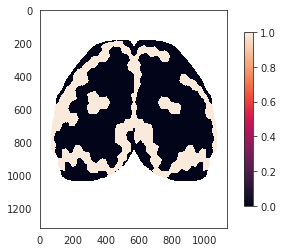

In [111]:
x2plt = proj_h['parcel2d-top'].squeeze()
x2plt = np.ma.masked_where(x2plt < 0.01, x2plt)
plt.imshow(np.logical_and(x2plt > np.quantile(h, 0.33), x2plt < np.quantile(h, 0.66)))
plt.colorbar(shrink=0.8)

In [131]:
h_vol = np.zeros(mice.parcel['cortex'].shape)

obj_idxs = pd.DataFrame(mice.parcel['cortex'].flat)
obj_idxs = obj_idxs.groupby([0]).indices

for ii, ids in obj_idxs.items():
    if ii == 0:
        continue
    hcl = mice.parcel.decode(int(ii))
    lr, cc, ll = hcl.flat
    node = gr.l2n.get(f"{lr}-{cc}-{ll}")
    if node is not None:
        h_vol.flat[ids] = h[node]
h_vol.shape

(132, 80, 114)

<matplotlib.colorbar.Colorbar object at 0x7f11b10a58b0>

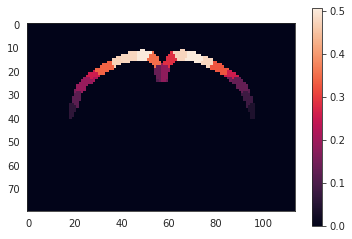

In [160]:
plt.imshow(h_vol[40])
plt.colorbar()

In [27]:
pi_anim = bn.nanmean(bn.nanmean(pi, 2), 1)
pi_anim.shape

(10, 5, 302)

In [28]:
pi_test = pi_anim[1]

In [29]:
disjoint = gr.get_disjoint_community(pi_test, to_vec=True)
pi_test = np.concatenate([pi_test, np.expand_dims(disjoint, 0)])

In [40]:
_proj = gr.project_vec(pi_test)

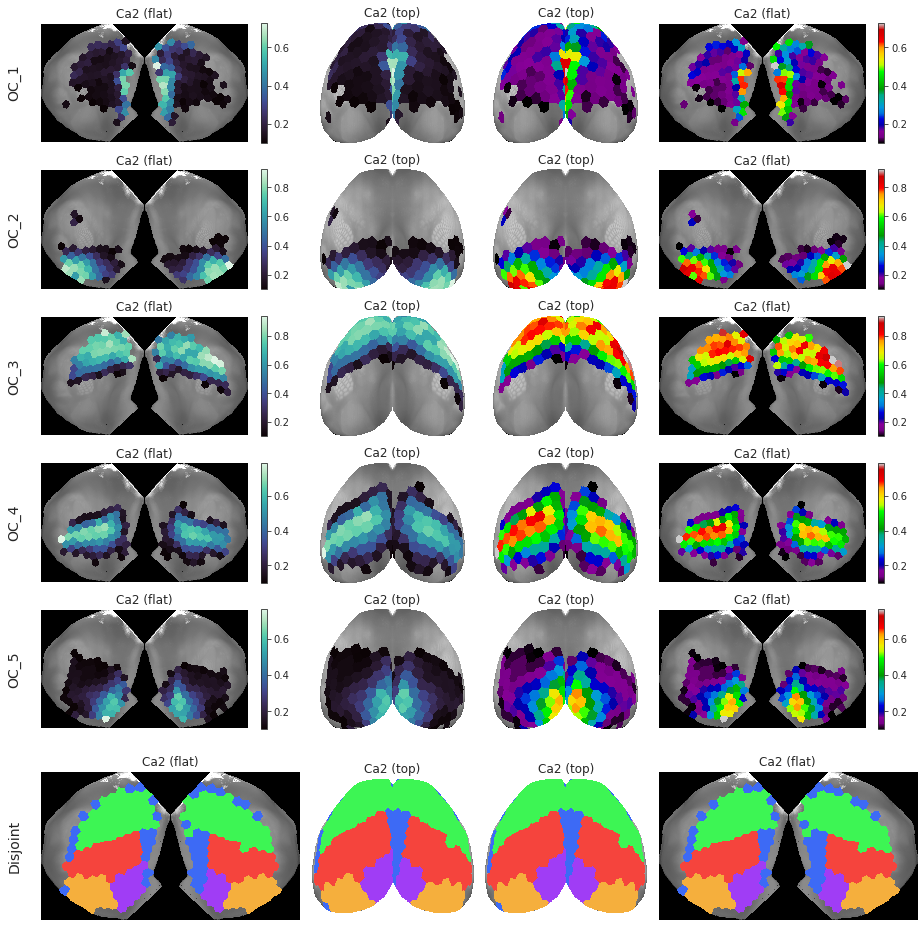

In [41]:
gr.show(_proj, labels=('Ca2',) * 2, cmaps=('mako', 'nipy_spectral'))

In [42]:
props = {
    'mice': mice,
    'num_k': 5,
    'perc': 'p15-sample',
    'metric': 'pearson',
    'match_metric': 'euclidean',
    'match_using': 'gam',
    'prepare_data': False,
    'verbose': False,
}

In [43]:
gr = Group(mode='bold-lite', centroids_from='runs', **props)
pi_arr, gam_arr, lam_arr = gr.fit_group(skip_align=True)

In [44]:
pi = bn.nanmean(pi_arr, -3)
pi_bold = bn.nanmean(pi.reshape(-1, *pi.shape[-2:]), 0)

disjoint = gr.get_disjoint_community(pi_bold, to_vec=True)
pi_bold = np.concatenate([pi_bold, np.expand_dims(disjoint, 0)])

pi_bold.shape

(6, 302)

In [45]:
proj_bold = gr.project_vec(pi_bold)

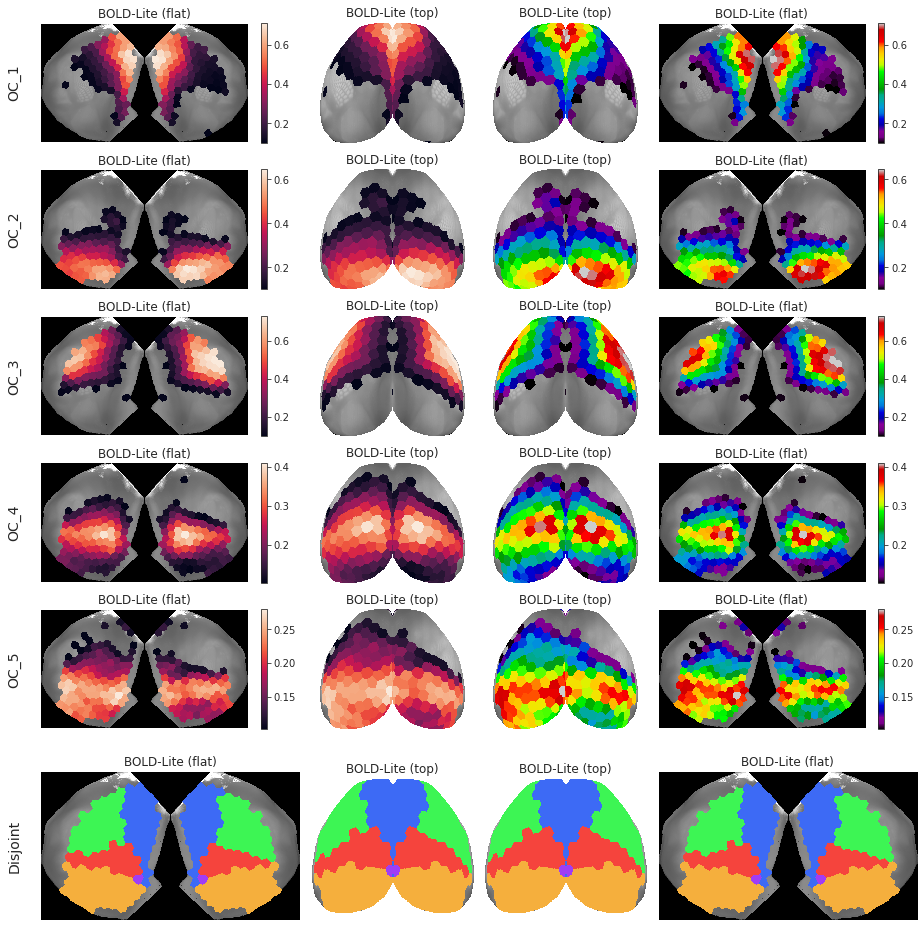

In [46]:
gr.show(proj_bold, labels=('BOLD-Lite',) * 2, cmaps=('rocket', 'nipy_spectral'))

In [48]:
sv = SVINET(**props, mode='bold-lite')
sv.pi_symmetry_score(pi_bold, 3)

{1: 0.995, 2: 0.994, 3: 0.986, 4: 0.988, 5: 0.987, -1: 0.99}

In [49]:
gr = Group(mode='bold-lite', centroids_from='runs', **props)
pi_arr, gam_arr, lam_arr = gr.fit_group(skip_align=False)

Warning, nan in global order

In [50]:
pi = bn.nanmean(pi_arr, -3)
pi_bold = bn.nanmean(pi.reshape(-1, *pi.shape[-2:]), 0)

disjoint = gr.get_disjoint_community(pi_bold, to_vec=True)
pi_bold = np.concatenate([pi_bold, np.expand_dims(disjoint, 0)])

pi_bold.shape

(6, 302)

In [51]:
proj_bold = gr.project_vec(pi_bold)

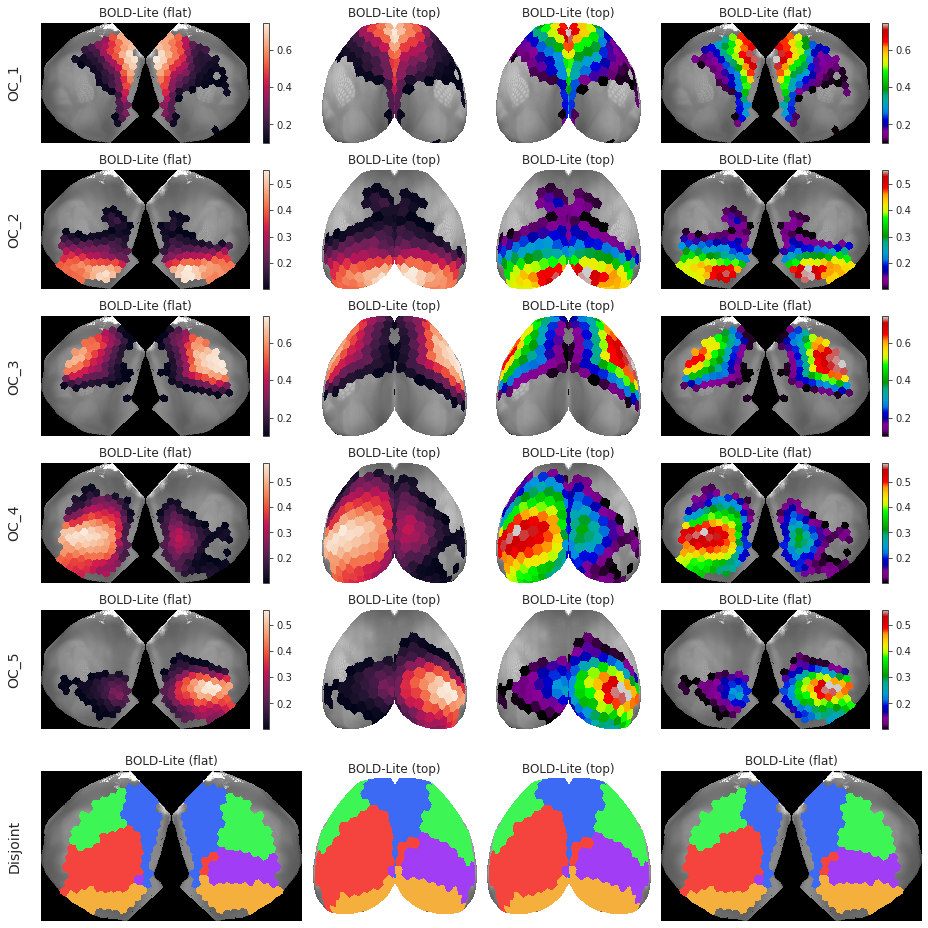

In [52]:
gr.show(proj_bold, labels=('BOLD-Lite',) * 2, cmaps=('rocket', 'nipy_spectral'))

In [53]:
sv = SVINET(**props, mode='bold-lite')
sv.pi_symmetry_score(pi_bold, 3)

{1: 0.994, 2: 0.995, 3: 0.982, 4: 0.888, 5: 0.891, -1: 0.95}

<AxesSubplot:ylabel='Count'>

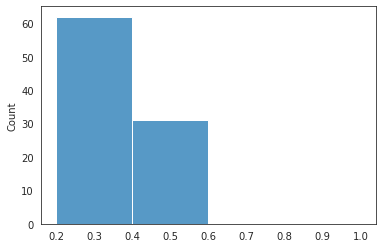

In [59]:
sns.histplot(pi_bold[4], bins=np.linspace(0.2, 1.0, 5))

In [60]:
pi = bn.nanmean(pi_arr, -3)
pi_bold = bn.nanmean(pi.reshape(-1, *pi.shape[-2:]), 0)
pi_bold.shape

(5, 302)

In [61]:
h = sp_stats.entropy(pi_bold, axis=0) / np.log(len(pi_bold))

In [62]:
proj_h = gr.project_vec(h)

<matplotlib.colorbar.Colorbar object at 0x7f11abb876d0>

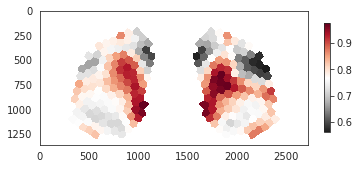

In [63]:
x2plt = proj_h['parcel2d-flat'].squeeze()
x2plt = np.ma.masked_where(x2plt < 0.01, x2plt)
plt.imshow(x2plt, cmap='RdGy_r')
plt.colorbar(shrink=0.5)

<matplotlib.colorbar.Colorbar object at 0x7f11b2e43940>

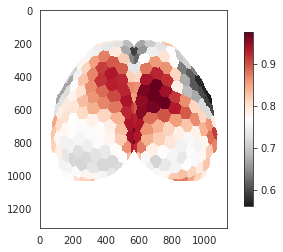

In [64]:
x2plt = proj_h['parcel2d-top'].squeeze()
x2plt = np.ma.masked_where(x2plt < 0.01, x2plt)
plt.imshow(x2plt, cmap='RdGy_r')
plt.colorbar(shrink=0.8)

In [65]:
pi_arr.shape

(10, 3, 4, 1000, 5, 302)

In [66]:
h_arr = sp_stats.entropy(pi_arr, axis=-2) / np.log(pi_arr.shape[-2])

In [67]:
h = np.nanmean(np.nanmean(np.nanmean(np.nanmean(h_arr, -2), 2), 1), 0)
h.shape, h_arr.shape

((302,), (10, 3, 4, 1000, 302))

In [68]:
proj_h = gr.project_vec(h)

<matplotlib.colorbar.Colorbar object at 0x7f1197c56d00>

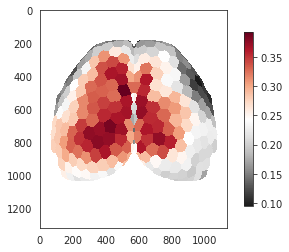

In [69]:
x2plt = proj_h['parcel2d-top'].squeeze()
x2plt = np.ma.masked_where(x2plt < 0.01, x2plt)
plt.imshow(x2plt, cmap='RdGy_r')
plt.colorbar(shrink=0.8)

<matplotlib.colorbar.Colorbar object at 0x7f11a47c07f0>

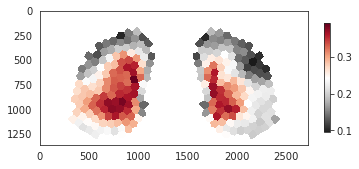

In [70]:
x2plt = proj_h['parcel2d-flat'].squeeze()
x2plt = np.ma.masked_where(x2plt < 0.01, x2plt)
plt.imshow(x2plt, cmap='RdGy_r')
plt.colorbar(shrink=0.5)

<matplotlib.colorbar.Colorbar object at 0x7fc34c761670>

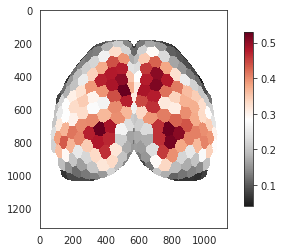

<matplotlib.colorbar.Colorbar object at 0x7fc34bf76640>

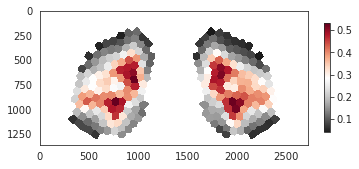

In [71]:
pi_anim = bn.nanmean(bn.nanmean(pi, 2), 1)
pi_anim.shape

(10, 5, 302)

In [72]:
pi_test = pi_anim[1]

In [73]:
disjoint = gr.get_disjoint_community(pi_test, to_vec=True)
pi_test = np.concatenate([pi_test, np.expand_dims(disjoint, 0)])

In [74]:
_proj = gr.project_vec(pi_test)

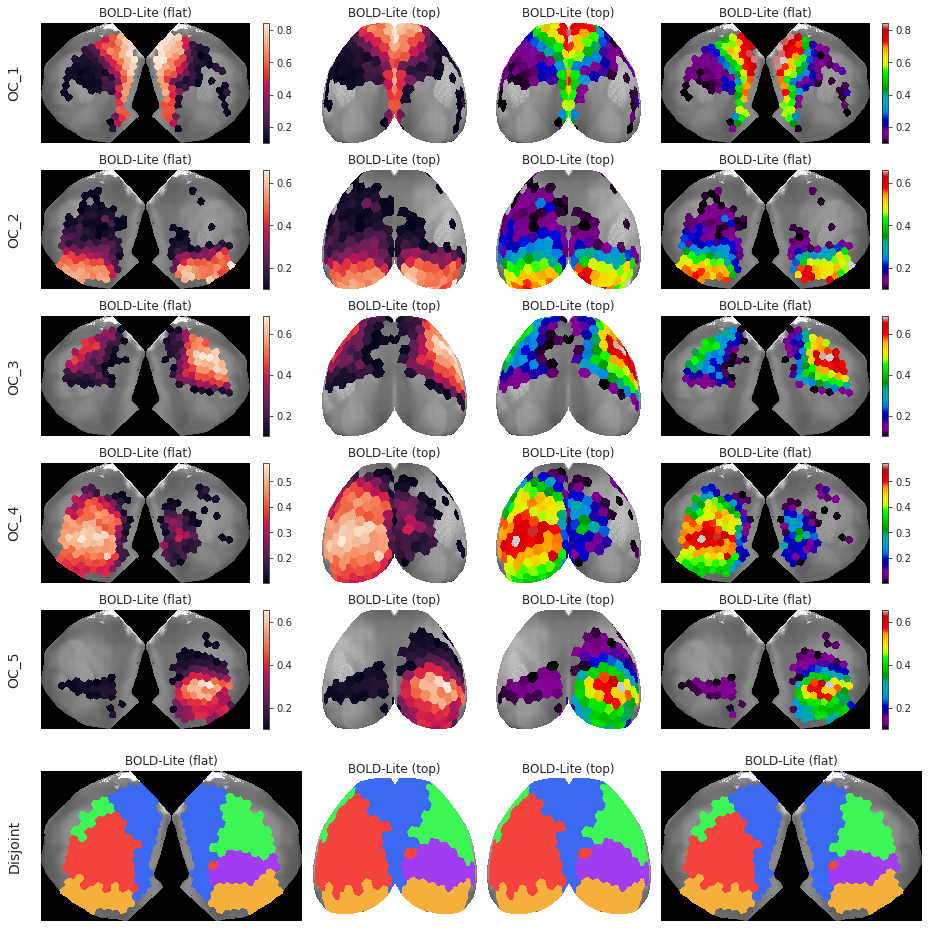

In [75]:
gr.show(_proj, labels=('BOLD-Lite',) * 2, cmaps=('rocket', 'nipy_spectral'))

In [ ]:


for path in tqdm(pathlib.Path(mice.cfg.svinet_dir).rglob(r"p[0-9]*")):


0it [00:00, ?it/s]

In [30]:
import fnmatch

paths = pathlib.Path(mice.cfg.svinet_dir)
run_counts = collections.defaultdict(dict)

In [32]:
for path in tqdm(paths.rglob(f"*{gr.base_name}*/**/p[0-9]*/")):
    if path.name.endswith('txt'):
        continue
    name = next(e for e in str(path).split('/') if '_sub-' in e)
    count = len(fnmatch.filter(os.listdir(path), r"*-mmsb-seed[0-9]*"))
    run_counts[gr.base_name][path.name] = count

0it [00:00, ?it/s]

In [33]:
run_counts

defaultdict(<class 'dict'>, {
    'n-192*4_bold-lite_rest_pearson_sub-SLC': {
        'p10-sample': 0,
        'p20-sample': 0,
        'p30-binary': 0,
        'p5-binary': 0,
        'p15-binary': 0,
        'p20-binary': 0,
        'p15-sample': 1000,
        'p5-sample': 0,
        'p30-sample': 0,
        'p10-binary': 0,
        'p40-binary': 1000,
        'p40-sample': 1000
    }
})

In [4]:
structs2align = [
    ['ACA', 'MOs'],
    ['VISp', 'VISpm'],
    ['SSp-m', 'SSs', 'MOp'],
    ['SSp-ll', 'SSp-tr'],
    ['ECT', 'PERI', 'TEa'],
    ['AId', 'AIv'],
]

gr = Group(mice, 5, 'p15-sample', 'bold-lite', centroids_from='all')#, structs2align=structs2align)

In [5]:
pi_arr, gam_arr, lam_arr = gr.fit_group()

Warning, nan in global order

In [6]:
__pi, gam, lam = tuple(map(
    lambda x: bn.nanmedian(x, -3),
    [pi_arr, gam_arr, lam_arr]
))

pi = gam / np.nansum(gam, -2, keepdims=True)
pi.shape

(10, 3, 4, 5, 302)

In [7]:
__pi_avg, pi_avg, gam_avg, lam_avg = tuple(map(
    lambda x: bn.nanmean(bn.nanmean(bn.nanmean(x, 2), 1), 0),
    [__pi, pi, gam, lam]
))

In [8]:
pi_avg.shape, np.isnan(pi_avg).sum()

((5, 302), 0)

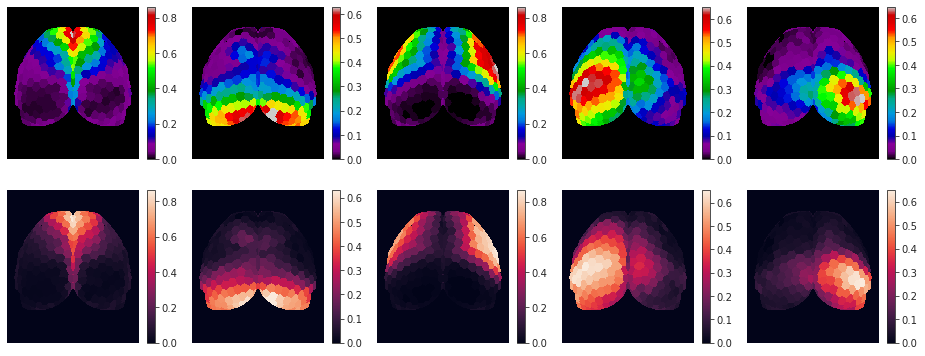

In [9]:
proj = gr.project_vec(pi_avg)

fig, axes = create_figure(2, len(pi_avg), (13, 5.5))
for i in range(len(pi_avg)):
    ax = axes[0, i]
    im = ax.imshow(proj['parcel2d-top'][i], cmap='nipy_spectral')
    plt.colorbar(im, ax=ax, shrink=0.8)
    
    ax = axes[1, i]
    im = ax.imshow(proj['parcel2d-top'][i])
    plt.colorbar(im, ax=ax, shrink=0.8)
remove_ticks(axes)
plt.show()

In [10]:
gr = Group(mice, 5, 'p15-sample', 'ca2', centroids_from='runs')#, structs2align=structs2align)

In [11]:
pi_arr, gam_arr, lam_arr = gr.fit_group()

Warning, nan in global order

In [12]:
__pi, gam, lam = tuple(map(
    lambda x: bn.nanmedian(x, -3),
    [pi_arr, gam_arr, lam_arr]
))

pi = gam / np.nansum(gam, -2, keepdims=True)
pi.shape

(10, 3, 4, 5, 302)

In [13]:
__pi_avg, pi_avg, gam_avg, lam_avg = tuple(map(
    lambda x: bn.nanmean(bn.nanmean(bn.nanmean(x, 2), 1), 0),
    [__pi, pi, gam, lam]
))

In [14]:
pi_avg.shape, np.isnan(pi_avg).sum()

((5, 302), 0)

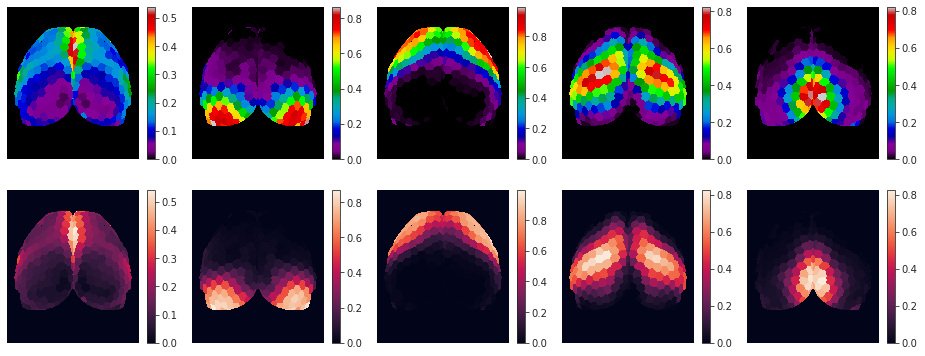

In [15]:
proj = gr.project_vec(pi_avg)

fig, axes = create_figure(2, len(pi_avg), (13, 5.5))
for i in range(len(pi_avg)):
    ax = axes[0, i]
    im = ax.imshow(proj['parcel2d-top'][i], cmap='nipy_spectral')
    plt.colorbar(im, ax=ax, shrink=0.8)
    
    ax = axes[1, i]
    im = ax.imshow(proj['parcel2d-top'][i])
    plt.colorbar(im, ax=ax, shrink=0.8)
remove_ticks(axes)
plt.show()

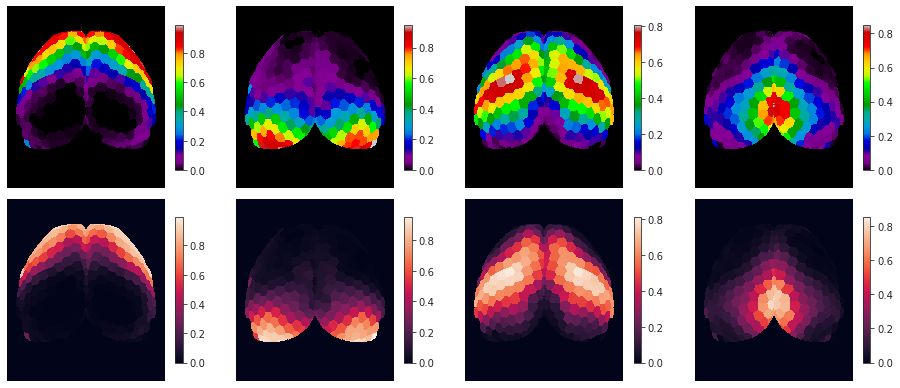

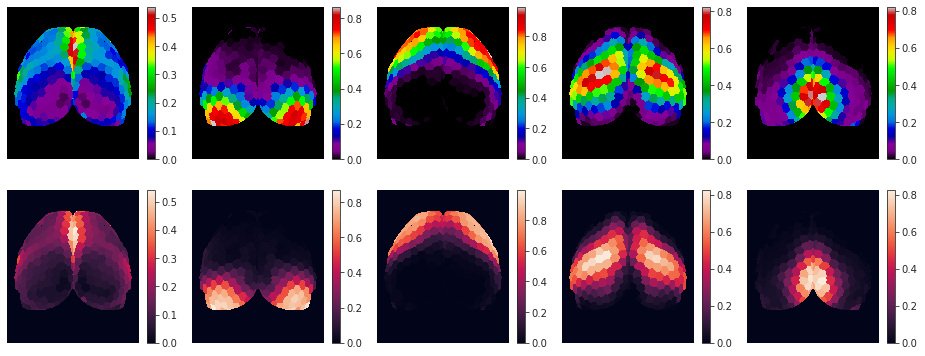

In [17]:
pi, gam, lam = bn.nanmedian(gam_arr, -3)
gam.shape

(10, 3, 4, 5, 302)

In [23]:
gam_avg = bn.nanmean(bn.nanmean(bn.nanmean(gam, 2), 1), 0)
gam_avg.shape

(5, 302)

In [24]:
np.isnan(gam_avg).sum()

0

In [25]:
pi_avg = gam_avg / np.nansum(gam_avg, 0, keepdims=True)
proj = gr.project_vec(pi_avg)

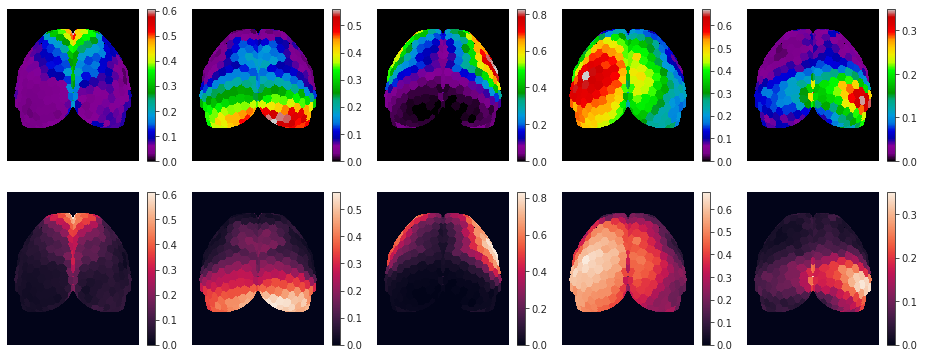

In [26]:
pi_avg = gam_avg / np.nansum(gam_avg, 0, keepdims=True)
proj = gr.project_vec(pi_avg)

fig, axes = create_figure(2, 5, (13, 5.5))
for i in range(5):
    ax = axes[0, i]
    im = ax.imshow(proj['parcel2d-top'][i], cmap='nipy_spectral')
    plt.colorbar(im, ax=ax, shrink=0.8)
    
    ax = axes[1, i]
    im = ax.imshow(proj['parcel2d-top'][i])
    plt.colorbar(im, ax=ax, shrink=0.8)
remove_ticks(axes)
plt.show()

In [32]:
pi_avg_2, gam_avg_2 = [], []
for k, sv in svinets.items():
    if sv is None:
        print('vay dada')
    if mice.looper[k][-1] > 0:
        gam_avg_2.append(np.expand_dims(sv.gam, 0))
        pi_avg_2.append(np.expand_dims(sv.pi, 0))

In [33]:
pi_avg_2 = np.concatenate(pi_avg_2)
gam_avg_2 = np.concatenate(gam_avg_2)
pi_avg_2.shape, gam_avg_2.shape

((114, 5, 302), (114, 5, 302))

In [34]:
pi_avg_2 = bn.nanmean(pi_avg_2, 0)
gam_avg_2 = bn.nanmean(gam_avg_2, 0)

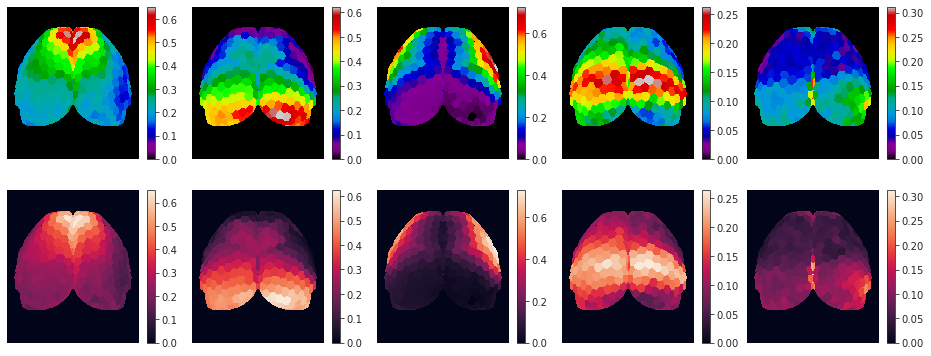

In [38]:
proj = gr.project_vec(pi_avg_2)

fig, axes = create_figure(2, 5, (13, 5.5))
for i in range(5):
    ax = axes[0, i]
    im = ax.imshow(proj['parcel2d-top'][i], cmap='nipy_spectral')
    plt.colorbar(im, ax=ax, shrink=0.8)
    
    ax = axes[1, i]
    im = ax.imshow(proj['parcel2d-top'][i])
    plt.colorbar(im, ax=ax, shrink=0.8)
remove_ticks(axes)
plt.show()

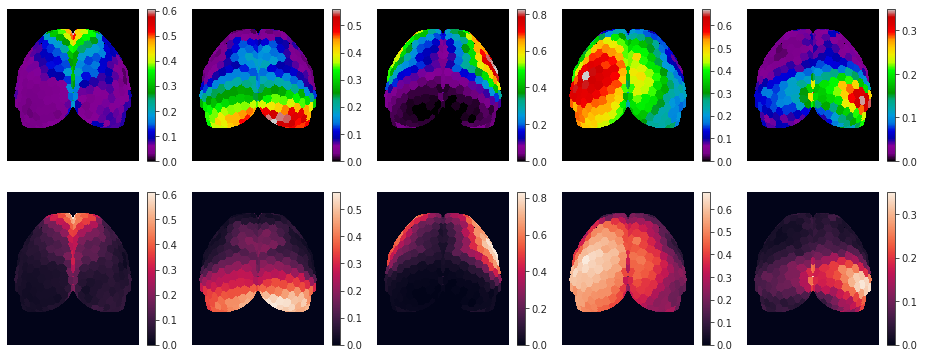

In [35]:
pi_avg = gam_avg / np.nansum(gam_avg, 0, keepdims=True)
proj = gr.project_vec(pi_avg)

fig, axes = create_figure(2, 5, (13, 5.5))
for i in range(5):
    ax = axes[0, i]
    im = ax.imshow(proj['parcel2d-top'][i], cmap='nipy_spectral')
    plt.colorbar(im, ax=ax, shrink=0.8)
    
    ax = axes[1, i]
    im = ax.imshow(proj['parcel2d-top'][i])
    plt.colorbar(im, ax=ax, shrink=0.8)
remove_ticks(axes)
plt.show()

In [9]:
len(nonan), centroids.shape

(281, (5, 302))

In [10]:
_centroids, _ = fit_kmeans(
    data=data[:, nonan],
    n_clusters=len(which_clusters),
    match_metric='euclidean',
    random_state=self.mice.cfg.random_state,
    normalize=True,
)
centroids[:, nonan] = _centroids

In [11]:
list(which_clusters) != list(range(self.num_k))

False

In [15]:
pi = centroids / np.nansum(centroids, 0, keepdims=True)
proj = gr.project_vec(pi)

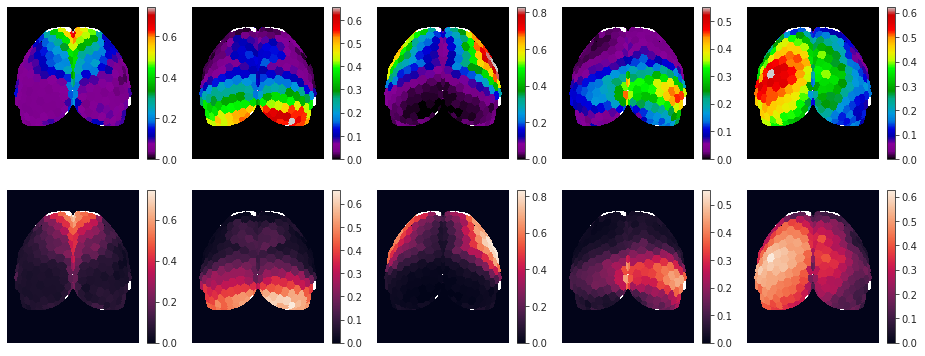

In [16]:
fig, axes = create_figure(2, 5, (13, 5.5))
for i in range(5):
    ax = axes[0, i]
    im = ax.imshow(proj['parcel2d-top'][i], cmap='nipy_spectral')
    plt.colorbar(im, ax=ax, shrink=0.8)
    
    ax = axes[1, i]
    im = ax.imshow(proj['parcel2d-top'][i])
    plt.colorbar(im, ax=ax, shrink=0.8)
remove_ticks(axes)
plt.show()

In [17]:
global_mapping = self.align_centroid_to_structs(
    pi_mv=pi,
    dist_metric=self.dist_metric,
    global_order=self.global_order,
)

In [18]:
global_mapping

[0, 1, 2, 4, 3]

In [19]:
centroids = centroids[global_mapping]

In [20]:
pi = centroids / np.nansum(centroids, 0, keepdims=True)
proj = gr.project_vec(pi)

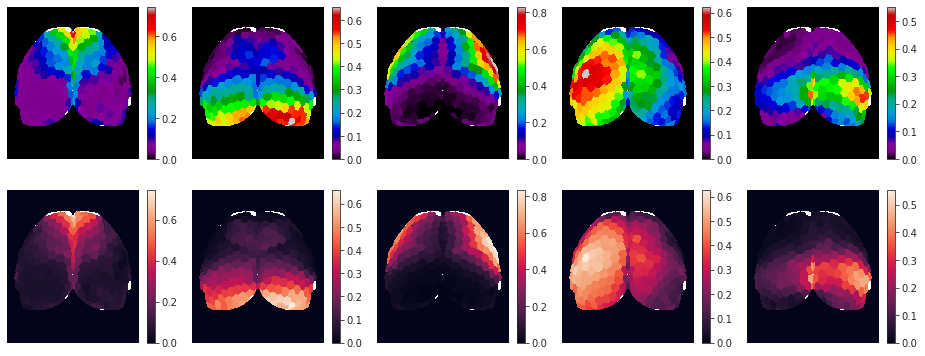

In [21]:
fig, axes = create_figure(2, 5, (13, 5.5))
for i in range(5):
    ax = axes[0, i]
    im = ax.imshow(proj['parcel2d-top'][i], cmap='nipy_spectral')
    plt.colorbar(im, ax=ax, shrink=0.8)
    
    ax = axes[1, i]
    im = ax.imshow(proj['parcel2d-top'][i])
    plt.colorbar(im, ax=ax, shrink=0.8)
remove_ticks(axes)
plt.show()

In [22]:
ner = Normalizer()

In [23]:
xxx = ner.fit_transform(centroids[:, nonan])

In [26]:
for k, g in gammas.items():
    try:
        ner.fit_transform(g[:, nonan])
    except:
        print(k)

sub-SLC08_ses-3

sub-SLC08

In [27]:
g = gammas['sub-SLC08_ses-3']
g.shape

(5, 302)

In [32]:
np.where(np.isnan(g).sum(0))[0]

array([131, 143, 150])

In [48]:
data_clean = {}
for k, g in gammas.items():
    _g = g[:, nonan]
    _g = np.where(~np.isnan(_g), _g, 0.0)
    try:
        data_clean[k] = ner.fit_transform(_g)
    except:
        print(k)
        break

In [50]:
proj = gr.project_vec(data_clean['sub-SLC'])

fig, axes = create_figure(2, 5, (13, 5.5))
for i in range(5):
    ax = axes[0, i]
    im = ax.imshow(proj['parcel2d-top'][i], cmap='nipy_spectral')
    plt.colorbar(im, ax=ax, shrink=0.8)
    
    ax = axes[1, i]
    im = ax.imshow(proj['parcel2d-top'][i])
    plt.colorbar(im, ax=ax, shrink=0.8)
remove_ticks(axes)
plt.show()

IndexError: index 281 is out of bounds for axis 0 with size 281

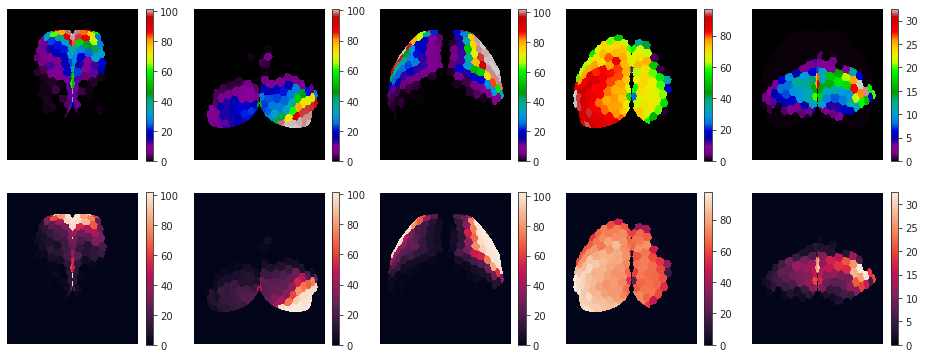

In [39]:
proj = gr.project_vec(svinets['sub-SLC'].gam)

fig, axes = create_figure(2, 5, (13, 5.5))
for i in range(5):
    ax = axes[0, i]
    im = ax.imshow(proj['parcel2d-top'][i], cmap='nipy_spectral')
    plt.colorbar(im, ax=ax, shrink=0.8)
    
    ax = axes[1, i]
    im = ax.imshow(proj['parcel2d-top'][i])
    plt.colorbar(im, ax=ax, shrink=0.8)
remove_ticks(axes)
plt.show()

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

In [5]:
svinets, perms, centroids = gr.align_group()

  0%|          | 0/160 [00:00<?, ?it/s]

In [6]:
perms

{
    'sub-SLC01_ses-1_run-1': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC01_ses-1_run-3': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC01_ses-1_run-5': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC01_ses-1_run-7': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC01_ses-2_run-1': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC01_ses-2_run-3': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC01_ses-2_run-5': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC01_ses-2_run-7': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC01_ses-3_run-1': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC01_ses-3_run-3': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC01_ses-3_run-5': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC01_ses-3_run-7': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC02_ses-1_run-1': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC02_ses-1_run-3': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC02_ses-1_run-5': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC02_ses-1_run-7': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC02_ses-2_run-1': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC02_ses-2_run-3': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC02_ses-2_run-5': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC02_ses-3_run-1': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC02_ses-3_run-3': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC02_ses-3_run-5': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC02_ses-3_run-7': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC03_ses-1_run-2': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC03_ses-1_run-4': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC03_ses-1_run-6': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC03_ses-2_run-1': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC03_ses-2_run-3': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC03_ses-2_run-5': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC03_ses-2_run-7': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC03_ses-3_run-1': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC03_ses-3_run-3': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC03_ses-3_run-5': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC03_ses-3_run-7': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC04_ses-1_run-1': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC04_ses-1_run-3': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC04_ses-1_run-5': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC04_ses-1_run-7': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC04_ses-2_run-1': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC04_ses-2_run-3': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC04_ses-2_run-5': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC04_ses-2_run-7': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC04_ses-3_run-1': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC04_ses-3_run-3': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC04_ses-3_run-5': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC04_ses-3_run-7': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC05_ses-1_run-1': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC05_ses-1_run-3': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC05_ses-1_run-7': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC05_ses-2_run-1': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC05_ses-2_run-3': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC05_ses-2_run-5': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC05_ses-2_run-7': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC05_ses-3_run-1': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC05_ses-3_run-3': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC05_ses-3_run-5': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC05_ses-3_run-7': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC06_ses-1_run-1': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC06_ses-1_run-3': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC06_ses-1_run-5': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC06_ses-1_run-7': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC06_ses-2_run-1': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC06_ses-2_run-3': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC06_ses-2_run-5': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC06_ses-2_run-7': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4},
    'sub-SLC06_ses-3_run-1': {0: 

In [7]:
centroids.shape

(5, 302)

[
    <matplotlib.lines.Line2D object at 0x7f6232b5fa60>,
    <matplotlib.lines.Line2D object at 0x7f6232b5f9d0>,
    <matplotlib.lines.Line2D object at 0x7f6232b5fb50>,
    <matplotlib.lines.Line2D object at 0x7f6232b5fc10>,
    <matplotlib.lines.Line2D object at 0x7f6232b5fcd0>
]

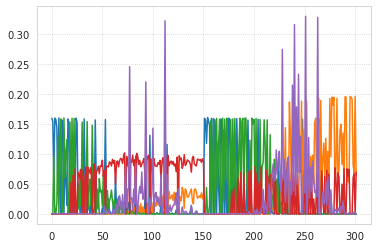

In [8]:
plt.plot(centroids.T)

In [9]:
pi = centroids / np.nansum(centroids, 0, keepdims=True)

[
    <matplotlib.lines.Line2D object at 0x7f62cf040790>,
    <matplotlib.lines.Line2D object at 0x7f62cf040a00>,
    <matplotlib.lines.Line2D object at 0x7f62cf040580>,
    <matplotlib.lines.Line2D object at 0x7f62cf040520>,
    <matplotlib.lines.Line2D object at 0x7f62cf040160>
]

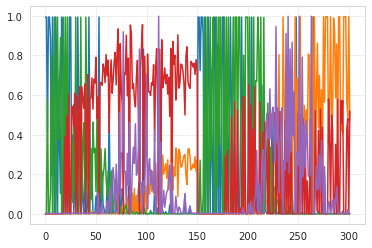

In [10]:
plt.plot(pi.T)

In [11]:
proj = gr.project_vec(pi)

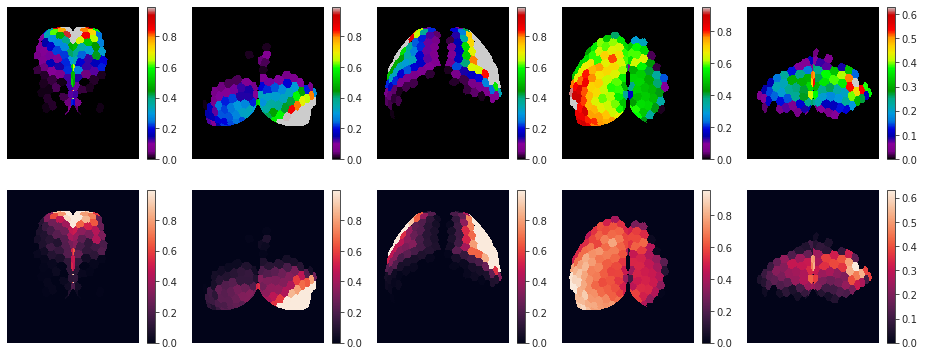

In [14]:
fig, axes = create_figure(2, 5, (13, 5.5))
for i in range(5):
    ax = axes[0, i]
    im = ax.imshow(proj['parcel2d-top'][i], cmap='nipy_spectral')
    plt.colorbar(im, ax=ax, shrink=0.8)
    
    ax = axes[1, i]
    im = ax.imshow(proj['parcel2d-top'][i])
    plt.colorbar(im, ax=ax, shrink=0.8)
remove_ticks(axes)
plt.show()

In [17]:
self = gr

In [22]:
seed_counts = []
for sv in svinets.values():
    seed_counts.append(len(sv.gam_all))

meta_key = f"{self.mode.split('-')[0]}_{self.task}"
run_counts = []
for key, (sub, ses, _) in self.mice.looper_agg.items():
    if sub == -1 or ses == -1:
        continue
    run_counts.append(len(
        self.mice.combine_meta[meta_key][key]
    ))
run_counts = collections.Counter(run_counts)
rng = get_rng(self.mice.cfg.random_state)

In [23]:
run_counts

Counter({4: 25, 3: 4, 2: 1})

In [24]:
collections.Counter(seed_counts).most_common()

[(980, 160)]

In [25]:
sv.gam_all.shape

(980, 5, 302)

In [4]:
pi_avg = []
for key in tqdm(mice.ca):
    if 'run' not in key:
        continue
    sv = SVINET(mice, 5, 'p40-sample', key, 'ca2', metric='pearson', verbose=False)
    _ = sv.load_results()
    if sv.pi is not None:
        pi_avg.append(np.expand_dims(sv.pi, axis=0))
    # proj = sv.project_vec()
    
    # fig, axes = create_figure(1, 5, (13, 3.))
    # for i, ax in enumerate(axes.flat):
    #     im = ax.imshow(proj['parcel2d-top'][i], cmap='nipy_spectral')
    #     plt.colorbar(im, ax=ax, shrink=0.8)
    # fig.suptitle(key, fontsize=14)
    # remove_ticks(axes)
    # plt.show()

  0%|          | 0/162 [00:00<?, ?it/s]

In [5]:
pi_avg = np.concatenate(pi_avg)
pi_avg.shape

(118, 5, 302)

In [6]:
pi_ca_runs = np.nanmean(pi_avg, 0)

In [7]:
proj = sv.project_vec(pi_ca_runs)

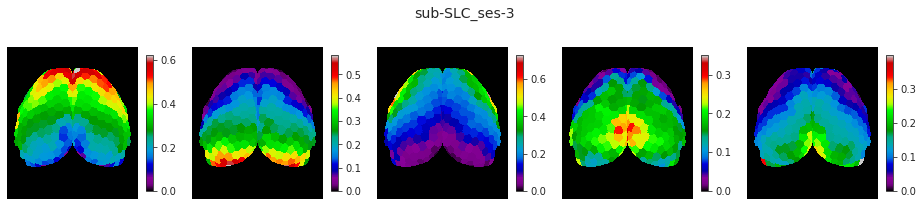

In [8]:
fig, axes = create_figure(1, 5, (13, 3.))
for i, ax in enumerate(axes.flat):
    im = ax.imshow(proj['parcel2d-top'][i], cmap='nipy_spectral')
    plt.colorbar(im, ax=ax, shrink=0.8)
fig.suptitle(key, fontsize=14)
remove_ticks(axes)
plt.show()

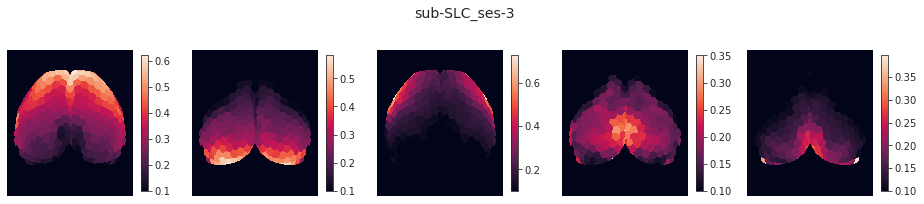

In [9]:
fig, axes = create_figure(1, 5, (13, 3.))
for i, ax in enumerate(axes.flat):
    im = ax.imshow(proj['parcel2d-top'][i], vmin=0.1)
    plt.colorbar(im, ax=ax, shrink=0.8)
fig.suptitle(key, fontsize=14)
remove_ticks(axes)
plt.show()

<matplotlib.image.AxesImage object at 0x7f4fe5afd250>

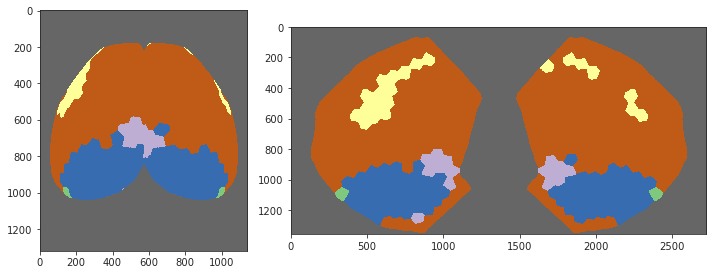

In [10]:
fig, axes = create_figure(1, 2, (10, 4), gridspec_kw={'width_ratios': [1, 2]})

x_ca_runs = np.nanargmax(proj['parcel2d-top'], axis=0)
x_ca_runs.flat[mice.parcel['nonzero-idxs_parcel2d-top']] += 1
axes[0].imshow(x_ca_runs, cmap='Accent_r')

y_ca_runs = np.nanargmax(proj['parcel2d-flat'], axis=0)
y_ca_runs.flat[mice.parcel['nonzero-idxs_parcel2d-flat']] += 1
axes[1].imshow(y_ca_runs, cmap='Accent_r')

In [11]:
pi_avg = []
for key in tqdm(mice.ca):
    sub, ses, run = mice.looper[key]
    if sub == -1 or ses == -1 or run != -1:
        continue
    sv = SVINET(mice, 5, 'p40-sample', key, 'ca2', metric='pearson', verbose=False)
    _ = sv.load_results()
    if sv.pi is not None:
        pi_avg.append(np.expand_dims(sv.pi, axis=0))
    # proj = sv.project_vec()
    
    # fig, axes = create_figure(1, 5, (13, 3.))
    # for i, ax in enumerate(axes.flat):
    #     im = ax.imshow(proj['parcel2d-top'][i], cmap='nipy_spectral')
    #     plt.colorbar(im, ax=ax, shrink=0.8)
    # fig.suptitle(key, fontsize=14)
    # remove_ticks(axes)
    # plt.show()

  0%|          | 0/162 [00:00<?, ?it/s]

In [12]:
pi_avg = np.concatenate(pi_avg)
pi_avg.shape

(30, 5, 302)

In [13]:
pi_ca_sess = np.nanmean(pi_avg, 0)

In [14]:
proj = sv.project_vec(pi_ca_sess)

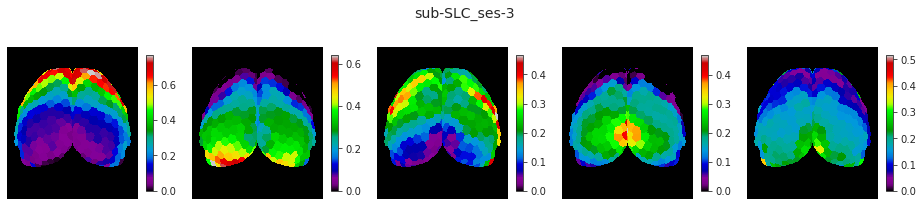

In [15]:
fig, axes = create_figure(1, 5, (13, 3.))
for i, ax in enumerate(axes.flat):
    im = ax.imshow(proj['parcel2d-top'][i], cmap='nipy_spectral')
    plt.colorbar(im, ax=ax, shrink=0.8)
fig.suptitle(key, fontsize=14)
remove_ticks(axes)
plt.show()

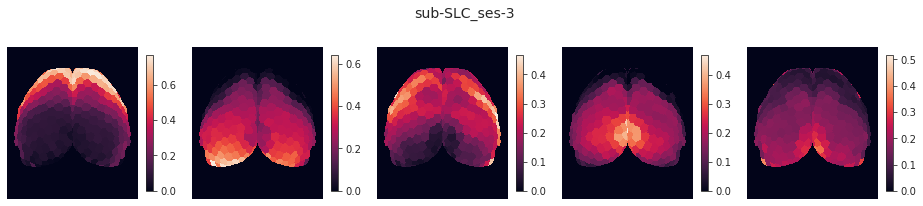

In [16]:
fig, axes = create_figure(1, 5, (13, 3.))
for i, ax in enumerate(axes.flat):
    im = ax.imshow(proj['parcel2d-top'][i])
    plt.colorbar(im, ax=ax, shrink=0.8)
fig.suptitle(key, fontsize=14)
remove_ticks(axes)
plt.show()

<matplotlib.image.AxesImage object at 0x7f4fe55514c0>

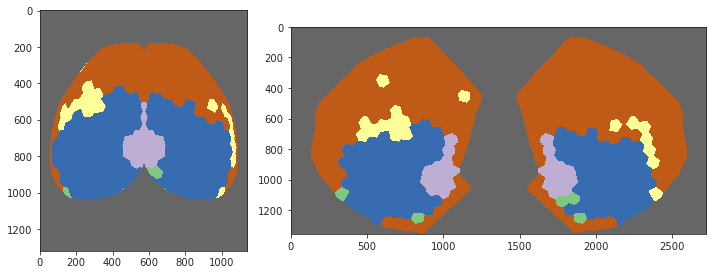

In [17]:
fig, axes = create_figure(1, 2, (10, 4), gridspec_kw={'width_ratios': [1, 2]})

x_ca_sess = np.nanargmax(proj['parcel2d-top'], axis=0)
x_ca_sess.flat[mice.parcel['nonzero-idxs_parcel2d-top']] += 1
axes[0].imshow(x_ca_sess, cmap='Accent_r')

y_ca_sess = np.nanargmax(proj['parcel2d-flat'], axis=0)
y_ca_sess.flat[mice.parcel['nonzero-idxs_parcel2d-flat']] += 1
axes[1].imshow(y_ca_sess, cmap='Accent_r')

In [18]:
pi_avg = []
for key in tqdm(mice.bold):
    if 'run' not in key:
        continue
    sv = SVINET(mice, 5, 'p40-sample', key, 'bold-lite', metric='pearson', verbose=False)
    _ = sv.load_results()
    if sv.pi is not None:
        pi_avg.append(np.expand_dims(sv.pi, axis=0))
    # proj = sv.project_vec()
    
    # fig, axes = create_figure(1, 5, (13, 3.))
    # for i, ax in enumerate(axes.flat):
    #     im = ax.imshow(proj['parcel2d-top'][i], cmap='nipy_spectral')
    #     plt.colorbar(im, ax=ax, shrink=0.8)
    # fig.suptitle(key, fontsize=14)
    # remove_ticks(axes)
    # plt.show()

  0%|          | 0/160 [00:00<?, ?it/s]

Warning, fits dir is empty

Warning, fits dir is empty

In [19]:
pi_avg = np.concatenate(pi_avg)
pi_avg.shape

(114, 5, 302)

In [20]:
pi_bl_runs = np.nanmean(pi_avg, 0)

In [21]:
proj = sv.project_vec(pi_bl_runs)

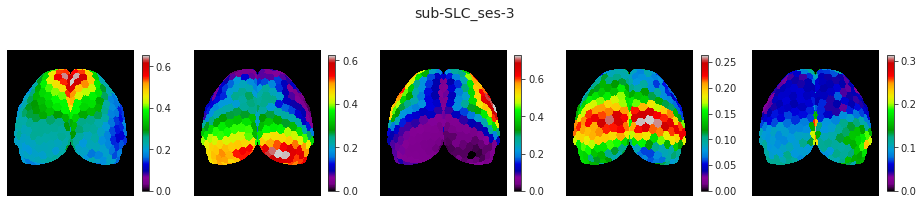

In [22]:
fig, axes = create_figure(1, 5, (13, 3.))
for i, ax in enumerate(axes.flat):
    im = ax.imshow(proj['parcel2d-top'][i], cmap='nipy_spectral')
    plt.colorbar(im, ax=ax, shrink=0.8)
fig.suptitle(key, fontsize=14)
remove_ticks(axes)
plt.show()

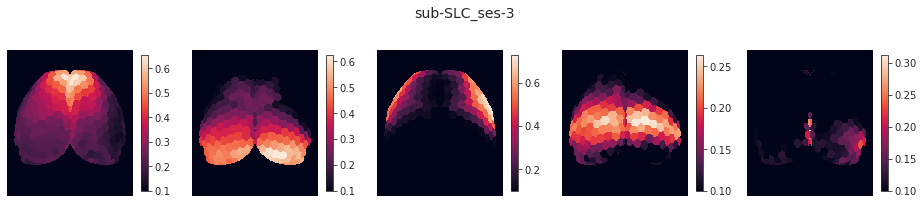

In [23]:
fig, axes = create_figure(1, 5, (13, 3.))
for i, ax in enumerate(axes.flat):
    im = ax.imshow(proj['parcel2d-top'][i], vmin=0.1)
    plt.colorbar(im, ax=ax, shrink=0.8)
fig.suptitle(key, fontsize=14)
remove_ticks(axes)
plt.show()

<matplotlib.image.AxesImage object at 0x7f4fe5f78d60>

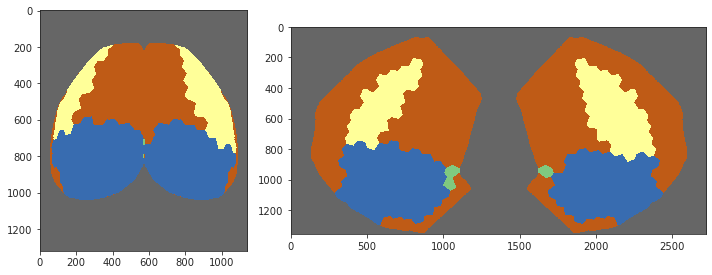

In [24]:
fig, axes = create_figure(1, 2, (10, 4), gridspec_kw={'width_ratios': [1, 2]})

x_bl_runs = np.nanargmax(proj['parcel2d-top'], axis=0)
x_bl_runs.flat[mice.parcel['nonzero-idxs_parcel2d-top']] += 1
axes[0].imshow(x_bl_runs, cmap='Accent_r')

y_bl_runs = np.nanargmax(proj['parcel2d-flat'], axis=0)
y_bl_runs.flat[mice.parcel['nonzero-idxs_parcel2d-flat']] += 1
axes[1].imshow(y_bl_runs, cmap='Accent_r')

In [25]:
pi_avg = []
for key in tqdm(mice.bold):
    sub, ses, run = mice.looper[key]
    if sub == -1 or ses == -1 or run != -1:
        continue
    sv = SVINET(mice, 5, 'p40-sample', key, 'bold-lite', metric='pearson', verbose=False)
    _ = sv.load_results()
    if sv.pi is not None:
        pi_avg.append(np.expand_dims(sv.pi, axis=0))
    # proj = sv.project_vec()
    
    # fig, axes = create_figure(1, 5, (13, 3.))
    # for i, ax in enumerate(axes.flat):
    #     im = ax.imshow(proj['parcel2d-top'][i], cmap='nipy_spectral')
    #     plt.colorbar(im, ax=ax, shrink=0.8)
    # fig.suptitle(key, fontsize=14)
    # remove_ticks(axes)
    # plt.show()

  0%|          | 0/160 [00:00<?, ?it/s]

In [26]:
pi_avg = np.concatenate(pi_avg)
pi_avg.shape

(30, 5, 302)

In [27]:
pi_bl_sess = np.nanmean(pi_avg, 0)

In [28]:
proj = sv.project_vec(pi_bl_sess)

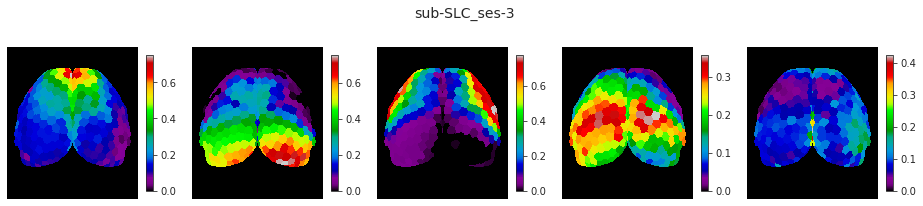

In [29]:
fig, axes = create_figure(1, 5, (13, 3.))
for i, ax in enumerate(axes.flat):
    im = ax.imshow(proj['parcel2d-top'][i], cmap='nipy_spectral')
    plt.colorbar(im, ax=ax, shrink=0.8)
fig.suptitle(key, fontsize=14)
remove_ticks(axes)
plt.show()

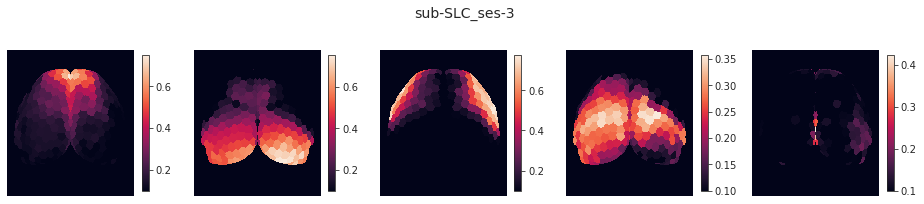

In [30]:
fig, axes = create_figure(1, 5, (13, 3.))
for i, ax in enumerate(axes.flat):
    im = ax.imshow(proj['parcel2d-top'][i], vmin=0.1)
    plt.colorbar(im, ax=ax, shrink=0.8)
fig.suptitle(key, fontsize=14)
remove_ticks(axes)
plt.show()

<matplotlib.image.AxesImage object at 0x7f4fe56755b0>

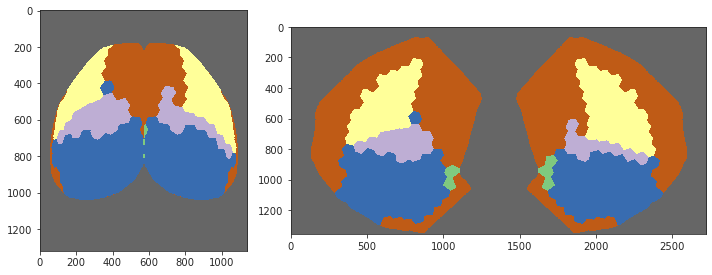

In [31]:
fig, axes = create_figure(1, 2, (10, 4), gridspec_kw={'width_ratios': [1, 2]})

x_bl_sess = np.nanargmax(proj['parcel2d-top'], axis=0)
x_bl_sess.flat[mice.parcel['nonzero-idxs_parcel2d-top']] += 1
axes[0].imshow(x_bl_sess, cmap='Accent_r')

y_bl_sess = np.nanargmax(proj['parcel2d-flat'], axis=0)
y_bl_sess.flat[mice.parcel['nonzero-idxs_parcel2d-flat']] += 1
axes[1].imshow(y_bl_sess, cmap='Accent_r')

In [32]:
d = sp_dist.cdist(pi_ca_runs, pi_ca_sess, metric='cosine')
sim = dist2sim(d)

<matplotlib.colorbar.Colorbar object at 0x7f4fe52de520>

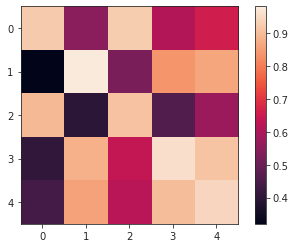

In [33]:
plt.imshow(sim)
plt.colorbar()

In [34]:
np.diag(sim)

array([0.92393911, 0.9826448 , 0.91149122, 0.96107837, 0.94567248])

<matplotlib.colorbar.Colorbar object at 0x7f4fe4752880>

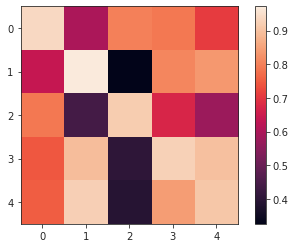

In [55]:
d = sp_dist.cdist(pi_ca_runs, pi_bl_runs, metric='cosine')
sim = dist2sim(d)

plt.imshow(sim)
plt.colorbar()

In [56]:
np.diag(sim), np.diag(sim).mean()

(
    array([0.93938741, 0.97217728, 0.92158353, 0.92783819, 0.90999917]),
    0.9341971171773128
)

<matplotlib.colorbar.Colorbar object at 0x7f4fe4679310>

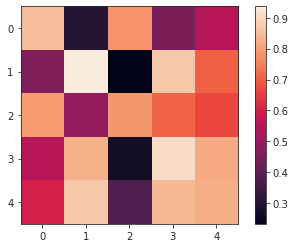

In [57]:
d = sp_dist.cdist(pi_ca_sess, pi_bl_sess, metric='cosine')
sim = dist2sim(d)

plt.imshow(sim)
plt.colorbar()

In [58]:
np.diag(sim), np.diag(sim).mean()

(
    array([0.85428295, 0.93676213, 0.78589216, 0.90661681, 0.82679314]),
    0.8620694371618273
)

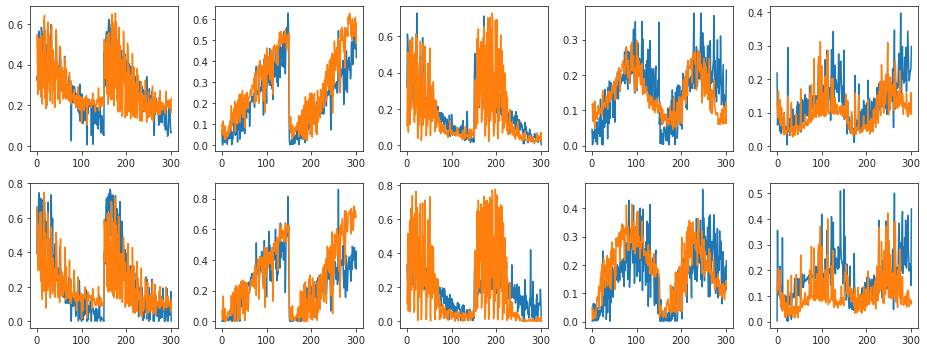

In [59]:
fig, axes = create_figure(2, 5, (13, 5))

for i in range(5):
    ax = axes[0, i]
    ax.plot(pi_ca_runs[i])
    ax.plot(pi_bl_runs[i])
    
    ax = axes[1, i]
    ax.plot(pi_ca_sess[i])
    ax.plot(pi_bl_sess[i])
plt.show()

<matplotlib.image.AxesImage object at 0x7f4fe42c1670>

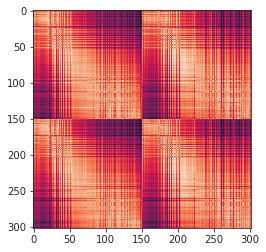

In [60]:
d = sp_dist.cdist(pi_ca_runs.T, pi_ca_sess.T, metric='jensenshannon')
sim_same = dist2sim(d)
plt.imshow(sim_same)

<matplotlib.image.AxesImage object at 0x7f4fe4218dc0>

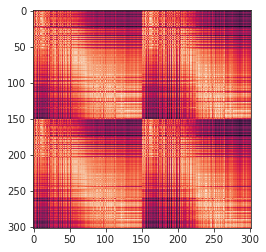

In [61]:
d = sp_dist.cdist(pi_ca_runs.T, pi_bl_runs.T, metric='jensenshannon')
sim_across = dist2sim(d)
plt.imshow(sim_across)

<AxesSubplot:ylabel='Count'>

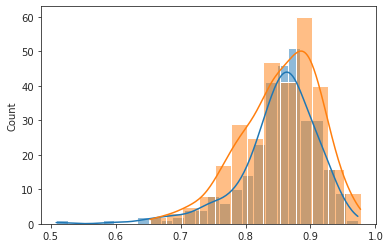

In [62]:
sns.histplot(np.diag(sim_same), kde=True)
sns.histplot(np.diag(sim_across), color='C1', kde=True)

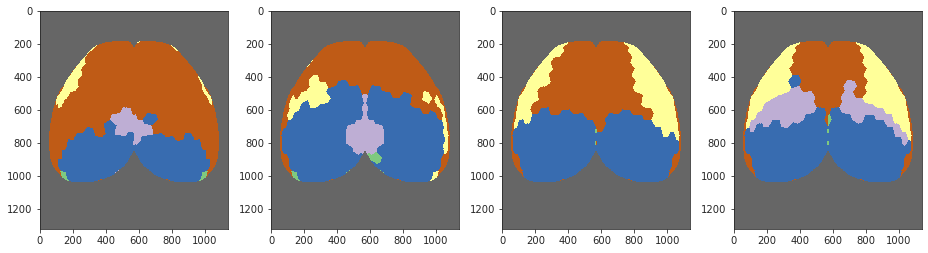

In [64]:
fig, axes = create_figure(1, 4, (13, 4))

axes[0].imshow(x_ca_runs, cmap='Accent_r')
axes[1].imshow(x_ca_sess, cmap='Accent_r')
axes[2].imshow(x_bl_runs, cmap='Accent_r')
axes[3].imshow(x_bl_sess, cmap='Accent_r')
plt.show()

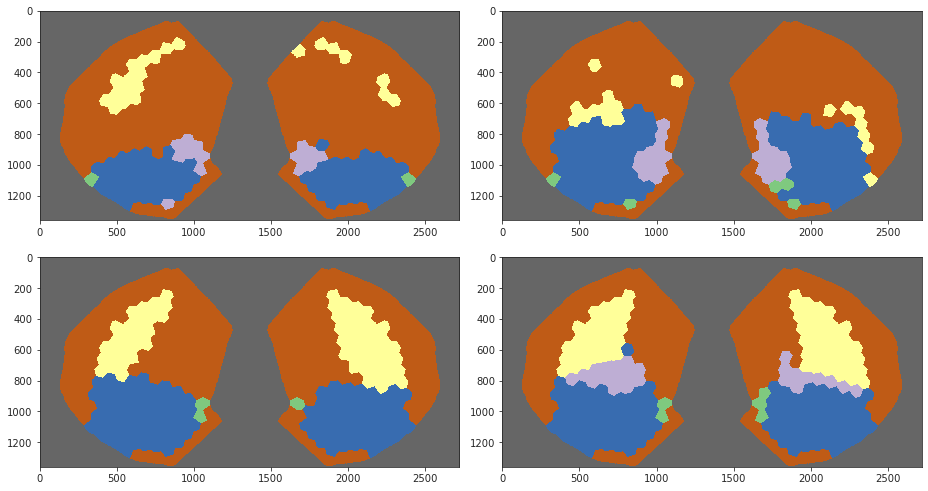

In [66]:
fig, axes = create_figure(2, 2, (13, 7))

axes.flat[0].imshow(y_ca_runs, cmap='Accent_r')
axes.flat[1].imshow(y_ca_sess, cmap='Accent_r')
axes.flat[2].imshow(y_bl_runs, cmap='Accent_r')
axes.flat[3].imshow(y_bl_sess, cmap='Accent_r')
plt.show()

In [4]:
gr = Group(mice, 5, 'p30-sample')

In [8]:
len(range(10))

10

In [9]:
np.delete(range(10), range(6, 10))

array([0, 1, 2, 3, 4, 5])

In [16]:
collections.Counter([1, 1, 1, 2,2])

1

In [4]:
sv = SVINET(mice, 5, 'p40-sample', 'sub-SLC', 'bold-lite', metric='pearson')

current expt: 'p40-sample'

In [5]:
_ = sv.load_results()

Warning, fits dir is empty

In [13]:
sv.path

In [8]:
sv.create_path(['test', 'hier'])

'/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-192*4/results/SVINET/n-192*4_bold-lite_rest_pearson_sub-SLC/test-hier-(2021_10_23)'

In [9]:
hier = Hierarchical(mice)

In [10]:
hier.create_path(['test', 'hier'])

'/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-192*4/results/Hierarchical/n-192*4_bold_rest_correlation_sub-SLC/test-hier-(2021_10_23)'

In [21]:
proj = sv.project_vec()

In [22]:
list(proj)

['parcel2d-top', 'parcel2d-flat', 'parcel3d']

<matplotlib.image.AxesImage object at 0x7f449f7c9550>

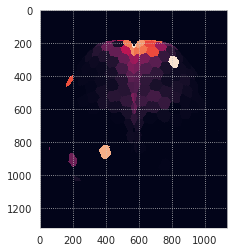

In [39]:
x = proj['parcel2d-top'][0].copy()
x[np.isnan(x)] = 0.0
plt.imshow(x)

[<matplotlib.lines.Line2D object at 0x7f44a0037940>]

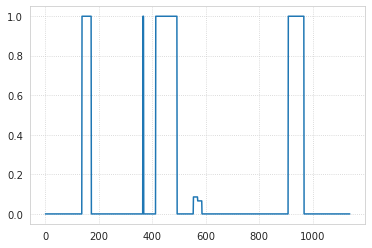

In [35]:
plt.plot(x[600])

In [43]:
y = mice.al.cortical_map(proj['parcel3d'][-1], 'top_view', np.nanmean)

In [44]:
y.shape

(1320, 1140)

<matplotlib.image.AxesImage object at 0x7f449f928640>

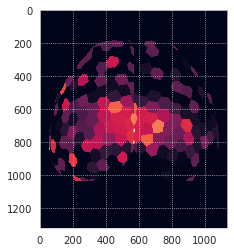

In [45]:
plt.imshow(y)

In [15]:
sv._create_save_dir()

'SVINET'

In [16]:
sv.path

'/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-192*4/results/SVINET/n-192*4_bold-lite_rest_pearson_sub-SLC/real-k5-p40-sample-euclidean-linksampling-(2021_10_23)'

In [18]:
sv.path.replace(sv.perc, 'p88-binary')

'/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-192*4/results/SVINET/n-192*4_bold-lite_rest_pearson_sub-SLC/real-k5-p88-binary-euclidean-linksampling-(2021_10_23)'

In [19]:
sv.path

'/home/hadi/Documents/Ca-fMRI/processed/norm-global_parcel-columnar_n-192*4/results/SVINET/n-192*4_bold-lite_rest_pearson_sub-SLC/real-k5-p40-sample-euclidean-linksampling-(2021_10_23)'

In [82]:
sv = SVINET(mice, 6, 'p40-sample', 'sub-SLC', 'bold', metric='spearman')

current expt: 'p40-sample'

In [83]:
_ = sv.load_runs()

[PROGRESS] experiment loaded: 'k = 6, p40-sample',  total # runs:  500

In [53]:
sv.pi.shape

(6, 1742)

[
    <matplotlib.lines.Line2D object at 0x7f44a060ffa0>,
    <matplotlib.lines.Line2D object at 0x7f44a060f9d0>,
    <matplotlib.lines.Line2D object at 0x7f44a060ff40>,
    <matplotlib.lines.Line2D object at 0x7f44a0643640>,
    <matplotlib.lines.Line2D object at 0x7f44a0643e20>,
    <matplotlib.lines.Line2D object at 0x7f44a01122b0>
]

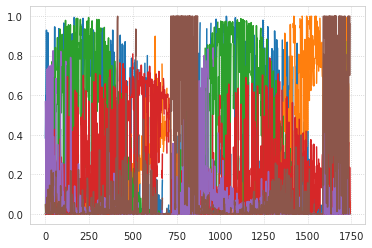

In [54]:
plt.plot(sv.pi.T)

In [55]:
proj = sv.project_vec()

In [56]:
list(proj)

['parcel2d-top', 'parcel2d-flat', 'parcel3d']

<AxesSubplot:ylabel='Count'>

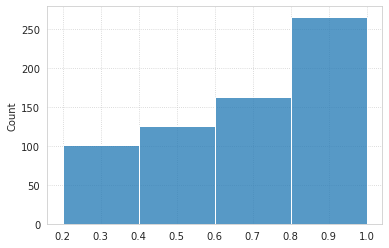

In [69]:
sns.histplot(np.round(sv.pi[2], 2), bins=np.linspace(0.2, 1.0, 5))

<matplotlib.colorbar.Colorbar object at 0x7f4328c21760>

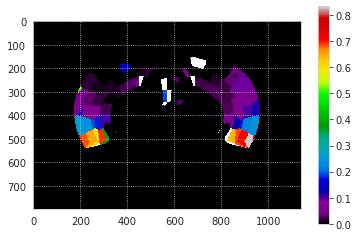

In [76]:
plt.imshow(proj['parcel3d'][4][400], cmap='nipy_spectral')
plt.colorbar()

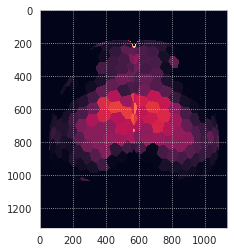

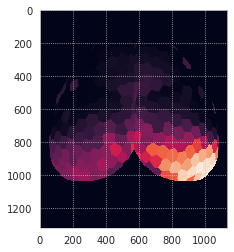

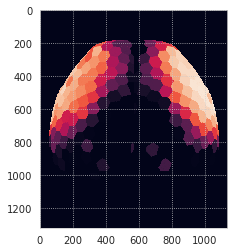

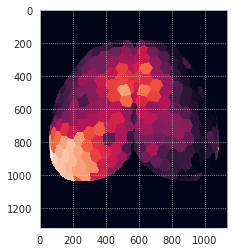

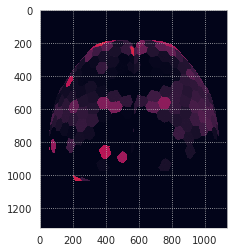

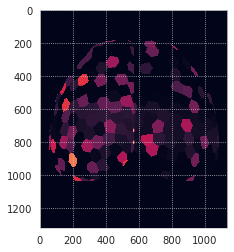

In [79]:
for i in range(sv.num_k):
    y = mice.al.cortical_map(proj['parcel3d'][i], 'top_view', np.nanmean)
    plt.imshow(y)
    plt.show()

In [122]:
key = 'sub-SLC10_ses-2_run-3'
net = Network(mice, key, 'bold-lite', metric='spearman')

In [87]:
net.fit_network()

[PROGRESS] fit: initiated

TypeError: 'float' object does not support item assignment

In [90]:
net.data.shape

(302, 550)

<matplotlib.image.AxesImage object at 0x7f4486ff1fa0>

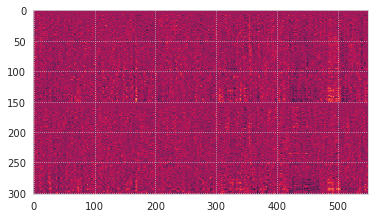

In [91]:
plt.imshow(net.data)

In [101]:
a, p = sp_stats.spearmanr(net.data, axis=1)
a, p 

(nan, nan)

In [100]:
a.shape

(550, 550)

[<matplotlib.lines.Line2D object at 0x7f448657b3a0>]

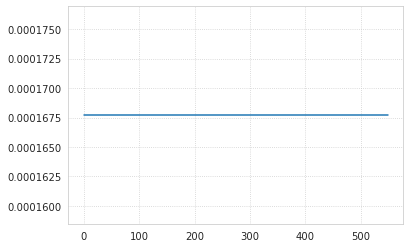

In [109]:
plt.plot(net.data[2])

<matplotlib.lines.Line2D object at 0x7f4483d1a2e0>

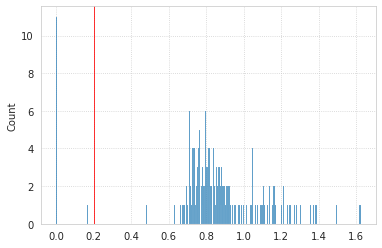

In [132]:
sns.histplot(np.std(net.data, axis=1), bins=500)
plt.axvline(0.2, lw=0.8, color='r')

<matplotlib.lines.Line2D object at 0x7f4484c43c40>

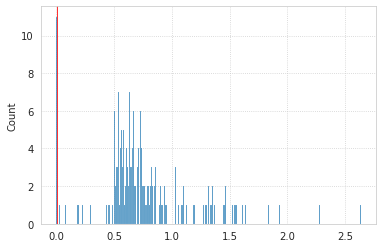

In [131]:
sns.histplot(np.var(net.data, axis=1), bins=500)
plt.axvline(0.01, lw=0.8, color='r')

(0.0, 0.1)

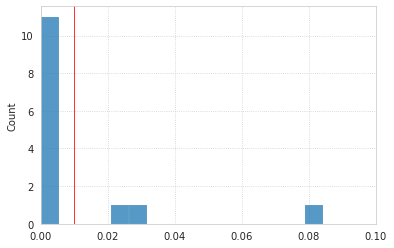

In [133]:
sns.histplot(np.var(net.data, axis=1), bins=500)
plt.axvline(0.01, lw=0.8, color='r')
plt.xlim(0., .1)

In [114]:
net.data[np.std(net.data, axis=1) < 1e-5] = np.nan

In [117]:
a, p = sp_stats.spearmanr(net.data, axis=1)

<matplotlib.image.AxesImage object at 0x7f4486555df0>

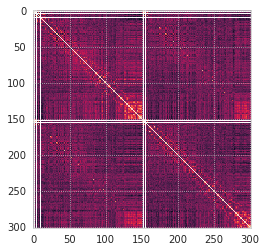

In [118]:
plt.imshow(a)

In [134]:
key = 'sub-SLC10_ses-2_run-3'
net = Network(mice, key, 'ca2', metric='spearman')

<matplotlib.lines.Line2D object at 0x7f44836dd1f0>

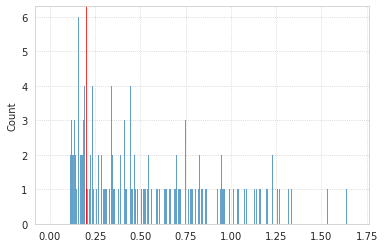

In [135]:
sns.histplot(np.std(net.data, axis=1), bins=500)
plt.axvline(0.2, lw=0.8, color='r')

<matplotlib.lines.Line2D object at 0x7f44835dbe80>

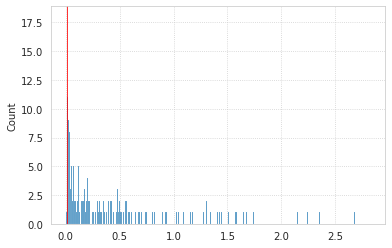

In [136]:
sns.histplot(np.var(net.data, axis=1), bins=500)
plt.axvline(0.01, lw=0.8, color='r')

(0.0, 0.1)

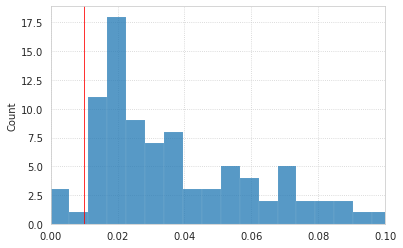

In [139]:
sns.histplot(np.var(net.data, axis=1), bins=500)
plt.axvline(0.01, lw=0.8, color='r')
plt.xlim(0., .1)

In [147]:
eps = 1e-3


3